# Osteoporosis Classification using Machine Learning

# 1.0  Business Understanding 💼

## 1.1 Problem statement
Osteoporosis is a progressive bone disease leading to increased fracture risk. Early detection is critical, yet standard diagnostics like DXA scans are expensive and not always accessible. Utilizing structured clinical and lifestyle factors—such as age, gender, hormonal status, prior fractures, lifestyle habits, comorbidities, and medications—for predictive modeling offers a scalable, cost-effective solution.

## 1.2 Strategic Importance

* **Reduce Diagnostic Costs:** Machine learning models can identify high-risk individuals without the need for expensive imaging tests.
* **Improve Accessibility:** Predictive tools can be deployed in primary care settings, expanding reach beyond specialized clinics.
* **Enable Personalized Risk Assessment:** Tailored interventions can be developed based on individual risk profiles.
* **Inform Public Health Strategies:** Data-driven insights can guide resource allocation and preventive measures.
* **Support AI-Based Clinical Decision Tools:** Integration into electronic health records can assist clinicians in decision-making.

**Recent Findings:**
A 2024 study developed a machine learning-based predictive model to screen individuals at high risk of osteoporosis using chronic disease data from primary healthcare records. The model demonstrated strong performance, highlighting the potential of machine learning in early detection and personalized management of osteoporosis ([Scientific Reports, 2024](https://www.nature.com/articles/s41598-024-56114-1)).

## 🎯 Key Objectives

1. **Model Development:** Predict osteoporosis risk from clinical and lifestyle features.
2. **Feature Analysis:** Identify which factors (e.g., hormonal changes, BMI, medications, prior fractures) drive risk.
3. **Application Deployment:** Develop an interactive web app using **Streamlit + FastAPI** for real-time risk assessment. Iterate to a clinical decision support tool.
4. **Visualization & Interpretation:** Use **Plotly** for visual exploration and decision-support dashboards.

---

## 🧪 Hypotheses

1. Age and gender are significantly related to the risk of developing osteoporosis.
2. Predictive modeling with structured clinical data alone can achieve clinically relevant accuracy (>85%).

---

## 🔍 Analytical Questions

1. Which features contribute most to osteoporosis risk in the dataset?
2. Can we predict osteoporosis accurately using structured clinical and lifestyle features alone?
3. How does risk vary by age, gender, and race/ethnicity?
4. How can visualization enhance understanding for clinicians and patients?
5. Can a deployed app provide actionable insights for early prevention?

---

## ✅ Success Criteria

* **Model Accuracy:** ≥85% overall with AUC ≥0.90.
* **Interpretability:** Feature importance aligns with clinical evidence.
* **Application Functionality:** Web app allows user input and real-time prediction.
* **Clinical Relevance:** High-risk cases correctly identified for early intervention.

---

## 🛠️ Methodology

1. **Data Preprocessing:**

   * Handle missing values (e.g., calcium/vitamin D intake).
   * Encode categorical variables (Gender, Hormonal Changes, Race/Ethnicity, etc.).
   * Normalize continuous variables (Age, Body Weight).

2. **Exploratory Data Analysis (EDA):**

   * Visualize distributions, correlations, and potential feature interactions using **Plotly**.

3. **Model Training:**

   * Baseline models: Logistic Regression, Random Forest, XGBoost etc.
   * Advanced models: Hybrid models, Neural networks if needed.
   * Evaluate via cross-validation with metrics: Accuracy, Precision, Recall, AUC.

4. **Deployment:**

   * **Streamlit** for front-end interface.
   * **FastAPI** for backend API serving predictions.

5. **Visualization:**

   * Feature importance plots, ROC curves, correlation heatmaps.






# 2.0 Data Understanding 📝
## 2.1 Prerequisites- Import needed packages

In [ ]:
# Os packages
import re
import os
from pathlib import Path

# Environmental variables
from dotenv import dotenv_values

# Data handling
import numpy as np
import pandas as pd
from googledrivedownloader import download_file_from_google_drive

# Type hinting
from typing import Dict, List, Union, Literal, Tuple, Iterable, Any

# Visualization
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff
import webp
from IPython.display import display
import plotly.io as pio

pio.renderers.default = "vscode+colab+plotly_mimetype+png" # Set default renderers for plotly
INTERACTIVE = True  # False, Display on plots as webp and render to display, works on GitHub. Set to True to use dynamic plots in supported environments
COLOR_DISCRETE_SEQUENCE = [px.colors.qualitative.Plotly[1], px.colors.qualitative.Plotly[0], px.colors.qualitative.Plotly[2], px.colors.qualitative.Plotly[3]]
pio.get_chrome() # Needed for kaleido

# Statistical tests
from scipy.stats import chi2_contingency

# MCA
from prince import MCA

# Feature Processing
from sklearn.base import ClassifierMixin
from sklearn.feature_selection import mutual_info_classif, SelectKBest  # Univariate Selection using KBest
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import RobustScaler, LabelEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as imPipeline
from imblearn.over_sampling import SMOTE # Balance class distribution

# Modelling
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
import lightgbm as lgb
from xgboost import XGBClassifier
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier

# Save model
import joblib
from huggingface_hub import notebook_login, HfApi, create_repo, upload_folder, snapshot_download, ModelCard

# Evaluation - Cross Validation & Hyperparameters Fine-tuning
from sklearn.metrics import f1_score, confusion_matrix, classification_report, roc_curve, auc

# Set pandas to display all columns
pd.set_option("display.max_columns", None)

# Suppress the scientific notation
pd.set_option("display.float_format", lambda x: "%.2f" % x)

# Disable warnings
import warnings
warnings.filterwarnings("ignore") # default


print("🛬 Imported all packages.", "Warnings hidden. 👻")

# TASK 2
## Engineer the features in the osteoporosis dataset, use it to create a machine learning model

## 2.2 Data reading

### 2.2.1 Path Constants

In [5]:
BASE_DIR = Path("../")
ENV_FILE = '../../env/notebook.env'
DATASET_DIR = os.path.join(BASE_DIR, "dataset")
DATASET_URL = "https://drive.google.com/file/d/14fb1ZMgpaqp-y0tt432azNw8b_anv9Lq/view?usp=sharing"
FILE_ID = "14fb1ZMgpaqp-y0tt432azNw8b_anv9Lq"
TRAIN_TEST = os.path.join(DATASET_DIR, "osteoporosis.csv")
TEST_FILE = os.path.join(BASE_DIR, "data/Test.csv")
TEST_FILE_URL = "https://raw.githubusercontent.com/D0nG4667/*Test.csv"
TRAIN_FILE = os.path.join(BASE_DIR, "data/Train.csv")
TRAIN_FILE_URL = "https://raw.githubusercontent.com/D0nG4667/*Train.csv"
PLOTS = os.path.join(BASE_DIR, "plots/")
SAVE_MODELS = os.path.join(BASE_DIR, "models/")

### 2.2.2 Environment variables & Other constants

In [6]:
# Load environment variables from .env file into a dictionary
environment_variables = dotenv_values(ENV_FILE)
# Get the hugginface token file path that you set in the '.env' file
TOKEN_FILE = environment_variables.get("TOKEN_FILE")

# Random state
RANDOM_STATE = 2025

### 2.2.3 Download Dataset

In [7]:
# Download Dataset
dest_path = os.path.join(DATASET_DIR, "dataset.zip")
download_file_from_google_drive(FILE_ID, dest_path, unzip=True, showsize=True)

896.0 KiB Done.
Unzipping...Done.


In [8]:
# List files in dataset folder
for file in os.listdir(DATASET_DIR):
    print(file)

ML INSTRUCTIONS.docx
dataset.zip
procedure_reference.csv
osteoporosis.csv
diagnosis_reference.csv
dirty_healthcare_dataset.csv


### 2.2.3 READ THE TRAIN_TEST DATASET

In [9]:
df_osteo = pd.read_csv(TRAIN_TEST)
df_osteo.head()

,Id,Age,Gender,Hormonal Changes,Family History,Race/Ethnicity,Body Weight,Calcium Intake,Vitamin D Intake,Physical Activity,Smoking,Alcohol Consumption,Medical Conditions,Medications,Prior Fractures,Osteoporosis
0,1734616,69,Female,Normal,Yes,Asian,Underweight,Low,Sufficient,Sedentary,Yes,Moderate,Rheumatoid Arthritis,Corticosteroids,Yes,1
1,1419098,32,Female,Normal,Yes,Asian,Underweight,Low,Sufficient,Sedentary,No,NaN,NaN,NaN,Yes,1
2,1797916,89,Female,Postmenopausal,No,Caucasian,Normal,Adequate,Sufficient,Active,No,Moderate,Hyperthyroidism,Corticosteroids,No,1
3,1805337,78,Female,Normal,No,Caucasian,Underweight,Adequate,Insufficient,Sedentary,Yes,NaN,Rheumatoid Arthritis,Corticosteroids,No,1
4,1351334,38,Male,Postmenopausal,Yes,African American,Normal,Low,Sufficient,Active,Yes,NaN,Rheumatoid Arthritis,NaN,Yes,1


In [10]:
df_osteo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1958 entries, 0 to 1957
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Id                   1958 non-null   int64 
 1   Age                  1958 non-null   int64 
 2   Gender               1958 non-null   object
 3   Hormonal Changes     1958 non-null   object
 4   Family History       1958 non-null   object
 5   Race/Ethnicity       1958 non-null   object
 6   Body Weight          1958 non-null   object
 7   Calcium Intake       1958 non-null   object
 8   Vitamin D Intake     1958 non-null   object
 9   Physical Activity    1958 non-null   object
 10  Smoking              1958 non-null   object
 11  Alcohol Consumption  970 non-null    object
 12  Medical Conditions   1311 non-null   object
 13  Medications          973 non-null    object
 14  Prior Fractures      1958 non-null   object
 15  Osteoporosis         1958 non-null   int64 
dtypes: int

In [11]:
df_osteo.isna().sum()

,0
Id,0
Age,0
Gender,0
Hormonal Changes,0
Family History,0
Race/Ethnicity,0
Body Weight,0
Calcium Intake,0
Vitamin D Intake,0
Physical Activity,0


In [12]:
df_osteo.duplicated().sum()

np.int64(0)

## Data Overview
### 2.3.1 Data Dictionary — Osteoporosis Classification Dataset

| **Column Name** | **Data Type** | **Non-Null Count** | **Description** | **Example Values** | **Analytical Notes / Usage** |
|-----------------|----------------|--------------------|-----------------|--------------------|------------------------------|
| **Id** | `int64` | 1958 | Unique identifier for each patient record. | `1734616` | Used as a unique key; not a predictive feature. |
| **Age** | `int64` | 1958 | Patient’s age in years. | `69`, `32`, `89` | Continuous numerical variable; expected positive correlation with osteoporosis risk. |
| **Gender** | `object` | 1958 | Biological sex of the patient. | `Male`, `Female` | Categorical; osteoporosis is more prevalent in females. |
| **Hormonal Changes** | `object` | 1958 | Hormonal status of the patient. | `Normal`, `Postmenopausal` | Categorical; postmenopausal women are at higher risk. |
| **Family History** | `object` | 1958 | Indicates whether there is a family history of osteoporosis. | `Yes`, `No` | Binary categorical; potential genetic risk factor. |
| **Race/Ethnicity** | `object` | 1958 | Ethnic background of the patient. | `Asian`, `Caucasian`, `African American` | Categorical; some races have varying bone density predispositions. |
| **Body Weight** | `object` | 1958 | Weight classification of the patient. | `Underweight`, `Normal`, `Overweight` | Ordinal categorical; underweight individuals often have higher risk. |
| **Calcium Intake** | `object` | 1958 | Estimated calcium intake level. | `Low`, `Adequate` | Ordinal categorical; low intake contributes to lower bone density. |
| **Vitamin D Intake** | `object` | 1958 | Estimated vitamin D intake level. | `Sufficient`, `Insufficient` | Ordinal categorical; low levels impair calcium absorption. |
| **Physical Activity** | `object` | 1958 | Patient’s general activity level. | `Active`, `Sedentary` | Categorical; sedentary lifestyle increases osteoporosis risk. |
| **Smoking** | `object` | 1958 | Smoking habits of the patient. | `Yes`, `No` | Binary categorical; smoking is a known risk factor. |
| **Alcohol Consumption** | `object` | 970 | Level of alcohol intake. | `None`, `Moderate`, `Heavy` | Categorical; missing values (~50%); moderate-to-heavy drinking increases risk. |
| **Medical Conditions** | `object` | 1311 | Presence of related medical conditions. | `Rheumatoid Arthritis`, `Hyperthyroidism`, `None` | Categorical; comorbidities affect bone metabolism. |
| **Medications** | `object` | 973 | Medications that may influence bone density. | `Corticosteroids`, `None` | Categorical; corticosteroids are a major osteoporosis risk factor. |
| **Prior Fractures** | `object` | 1958 | Indicates if the patient has had prior bone fractures. | `Yes`, `No` | Binary categorical; strong predictor of existing osteoporosis. |
| **Osteoporosis** | `int64` | 1958 | Target variable — presence (1) or absence (0) of osteoporosis. | `1`, `0` | Binary classification target. |

---

### 2.3.2 Dataset Summary

- **Total Records:** 1,958  
- **Total Features:** 16 (15 predictors + 1 target)  
- **Missing Data:** Present in `Alcohol Consumption`, `Medical Conditions`, and `Medications`.  
- **Target Variable:** `Osteoporosis`  
- **Problem Type:** Supervised Binary Classification  

---

### 2.3.3  Data Quality and Missing
| **Aspect**                           | **Observation**                                                                                                 | **Implication**                                                  | **Recommended Action**                                                       |
| ------------------------------------ | --------------------------------------------------------------------------------------------------------------- | ---------------------------------------------------------------- | ---------------------------------------------------------------------------- |
| **Completeness**                     | Dataset contains 1958 records with 16 columns                                                                   | Good coverage; adequate sample size for classification           | Proceed with exploratory analysis                                            |
| **Missing Data**                     | - `Alcohol Consumption`: 50.5% missing<br>- `Medical Conditions`: 33% missing<br>- `Medications`: 50.3% missing | Potential bias if missing not random (e.g., self-reporting bias) | Consider imputing with “Unknown” or “None”; evaluate via missingness heatmap |
| **Data Type Consistency**            | Most categorical variables stored as `object` type                                                              | Requires encoding before ML modeling                             | Use LabelEncoder or OneHotEncoder as appropriate                             |
| **Outliers**                         | Possible outliers in `Age` (e.g., >90 or <20)                                                                   | May distort scaling and feature distribution                     | Detect via IQR or z-score methods                                            |
| **Balance of Target (Osteoporosis)** | To be verified (check distribution of 0/1 classes)                                                              | Potential imbalance could bias classification model              | Use resampling (SMOTE, ADASYN) if needed                                     |
| **Multicollinearity Risk**           | Moderate correlation expected among intake and lifestyle factors                                                | Can inflate model variance                                       | Assess via correlation matrix and VIF analysis                               |

---

### 2.3.4 Analytical Insights 💡

- **Continuous variables:** `Age`  
- **Categorical variables:** 14 (nominal and ordinal mix)  
- **High-impact predictors:** `Age`, `Gender`, `Hormonal Changes`, `Body Weight`, `Calcium Intake`, `Vitamin D Intake`, `Medications`, `Prior Fractures`  
- **Preprocessing needs:**
  - Use snake case for renaming column names
  - Handle missing data (imputation or “Unknown” category)  
  - Encode categorical variables (One-Hot / Ordinal)  
  - Normalize continuous features for certain ML models  

PS: Age values (e.g., 20–90) have a much larger numeric range than encoded categorical variables (which are typically 0/1). Many ML models- not tree-based (e.g., logistic regression, SVM, neural networks, kNN) are sensitive to feature scale — large-valued features can dominate the learning process because data is split by distances and not threshold. Normalization (e.g., Min-Max scaling or StandardScaler) ensures all features contribute proportionally to the model’s learning process.

## 2.4 Cleaning 🧹

### 2.4.1 Standardize Column Names
- Use snake case

In [13]:
# Apply snake_case conversion
def to_snake_case(df: pd.DataFrame) -> pd.DataFrame:
    """
    Convert all column names of a pandas DataFrame to snake_case format.

    This function performs the following transformations on column names:
    1. Converts all characters to lowercase.
    2. Replaces spaces, slashes, parentheses, and hyphens with underscores.
    3. Removes any remaining non-alphanumeric characters except underscores.
    4. Strips leading and trailing underscores.

    Parameters
    ----------
    df : pd.DataFrame
        Input DataFrame whose columns need to be standardized.

    Returns
    -------
    pd.DataFrame
        DataFrame with standardized snake_case column names.

    Example
    -------
    >>> df = pd.DataFrame(columns=['Body Weight', 'Race/Ethnicity', 'Age'])
    >>> df = to_snake_case(df)
    >>> df.columns
    Index(['body_weight', 'race_ethnicity', 'age'], dtype='object')
    """
    # Apply transformations to column names
    df.columns = (
        df.columns
        .str.lower()  # Convert to lowercase
        .str.replace(r'[\s/()-]+', '_', regex=True)  # Replace spaces, slashes, hyphens, parentheses with '_'
        .str.replace(r'[^0-9a-z_]', '', regex=True)  # Remove any remaining invalid characters
        .str.strip('_')  # Remove leading/trailing underscores
    )
    return df

In [14]:
# Apply snake_case conversion to the osteoporosis dataset
df_osteo = to_snake_case(df_osteo)
df_osteo.columns

Index(['id', 'age', 'gender', 'hormonal_changes', 'family_history',
       'race_ethnicity', 'body_weight', 'calcium_intake', 'vitamin_d_intake',
       'physical_activity', 'smoking', 'alcohol_consumption',
       'medical_conditions', 'medications', 'prior_fractures', 'osteoporosis'],
      dtype='object')

### Key Insights

To ensure **naming consistency and data pipeline reliability**, all column names were standardized to follow the `snake_case` convention.  
This normalization enhances **readability**, **interoperability**, and **compatibility** across tools such as FastAPI, Streamlit, and SQL databases.

Inconsistent column naming (e.g., mixed case, spaces, or special characters) can cause key access errors and complicate downstream processes such as feature engineering, model training, and API schema generation.  

By applying a unified naming convention, the dataset achieves:
- **Clean and reproducible structure** across all preprocessing and modeling stages.  
- **Seamless feature reference** during visualization and machine learning workflows.  
- **API-ready schema design** aligned with industry best practices.

```python
# Apply snake_case transformation to column names
df_osteo.columns = (
    df_osteo.columns
    .str.lower()
    .str.replace(r'[\s/()-]+', '_', regex=True)
    .str.replace(r'[^0-9a-z_]', '', regex=True)
    .str.strip('_')
)


### 2.4.2 Fix data types
- Object columns as category

In [15]:
df_osteo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1958 entries, 0 to 1957
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   1958 non-null   int64 
 1   age                  1958 non-null   int64 
 2   gender               1958 non-null   object
 3   hormonal_changes     1958 non-null   object
 4   family_history       1958 non-null   object
 5   race_ethnicity       1958 non-null   object
 6   body_weight          1958 non-null   object
 7   calcium_intake       1958 non-null   object
 8   vitamin_d_intake     1958 non-null   object
 9   physical_activity    1958 non-null   object
 10  smoking              1958 non-null   object
 11  alcohol_consumption  970 non-null    object
 12  medical_conditions   1311 non-null   object
 13  medications          973 non-null    object
 14  prior_fractures      1958 non-null   object
 15  osteoporosis         1958 non-null   int64 
dtypes: int

In [16]:
# Object columns as category
categorical_cols = df_osteo.select_dtypes(include=["object"]).columns
df_osteo[categorical_cols] = df_osteo[categorical_cols].astype("category")

In [17]:
df_osteo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1958 entries, 0 to 1957
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   id                   1958 non-null   int64   
 1   age                  1958 non-null   int64   
 2   gender               1958 non-null   category
 3   hormonal_changes     1958 non-null   category
 4   family_history       1958 non-null   category
 5   race_ethnicity       1958 non-null   category
 6   body_weight          1958 non-null   category
 7   calcium_intake       1958 non-null   category
 8   vitamin_d_intake     1958 non-null   category
 9   physical_activity    1958 non-null   category
 10  smoking              1958 non-null   category
 11  alcohol_consumption  970 non-null    category
 12  medical_conditions   1311 non-null   category
 13  medications          973 non-null    category
 14  prior_fractures      1958 non-null   category
 15  osteoporosis         

### Target Column Handling — `Osteoporosis`

The target variable, `osteoporosis`, indicates whether a patient has osteoporosis (`1 = Yes`, `0 = No`).  
It is stored as an **integer (`int64`)**, which is fully compatible with supervised binary classification models.

#### Key Considerations:

- **Data Clarity:** Converting the column to a categorical dtype (`category`) is optional for binary targets. It can improve human readability and make it explicit that this is a discrete label, not a continuous variable.
- **ML Model Compatibility:** Most machine learning frameworks expect numeric labels for classification. Since the target is already 0/1, no further encoding is necessary.
- **Memory Efficiency:** Converting to `category` reduces memory usage in very large datasets, but the effect is negligible for small to medium-sized datasets (~2k rows in this project).

#### Decision:

For this project:
- The `osteoporosis` column will **remain as `int64`**, maintaining simplicity and direct compatibility with ML pipelines.
- Optionally, the column can be converted to `category` for visualization or clarity during exploratory data analysis.

```python
# Optional: Convert to categorical for clarity
# df_osteo['osteoporosis'] = df_osteo['osteoporosis'].astype('category')


### 2.4.2 Identify columns as numerical, categorical, and target.

In [18]:
# -----------------------------
# Target column
# -----------------------------
target_col = 'osteoporosis'

# -----------------------------
# Identifier column (not used in modeling)
# -----------------------------
id_col = 'id'

# -----------------------------
# Numerical columns
# -----------------------------
numerical_cols = df_osteo.select_dtypes(include='number').columns.tolist()
numerical_cols.remove(target_col)
numerical_cols.remove(id_col)

# -----------------------------
# Categorical columns
# -----------------------------
categorical_cols = df_osteo.select_dtypes(include='category').columns.tolist()


In [19]:
target_col

'osteoporosis'

In [20]:
numerical_cols

['age']

In [21]:
categorical_cols

['gender',
 'hormonal_changes',
 'family_history',
 'race_ethnicity',
 'body_weight',
 'calcium_intake',
 'vitamin_d_intake',
 'physical_activity',
 'smoking',
 'alcohol_consumption',
 'medical_conditions',
 'medications',
 'prior_fractures']

## 2.4.3 Handle Missingness

In [22]:
def handle_missing(
    df: pd.DataFrame,
    col_category_map: Dict[str, Literal['none', 'unknown']]
) -> pd.DataFrame:
    """
    Fill missing values in categorical clinical columns safely.

    Each column can have missing values handled in one of two ways:
    - 'none'    : missing values indicate true absence (e.g., no condition or no medication).
    - 'unknown' : missing values indicate unreported/ambiguous information.

    The function adds the appropriate category ('None' or 'Unknown') to the column
    before filling missing values to ensure compatibility with pandas Categorical dtype.

    Parameters
    ----------
    df : pd.DataFrame
        The input DataFrame containing clinical categorical columns.
    col_category_map : dict
        Dictionary mapping column names to missing value handling type:
            keys   = column names (str)
            values = 'none' or 'unknown'

    Returns
    -------
    pd.DataFrame
        DataFrame with missing values filled according to specified clinical logic.
    """
    for col, missing_type in col_category_map.items():
        if col in df.columns:
            # Determine the category to add
            new_cat = 'None' if missing_type == 'none' else 'Unknown'

            # If column is categorical, add the new category
            if pd.api.types.is_categorical_dtype(df[col]):
                existing_cats = df[col].cat.categories
                if new_cat not in existing_cats:
                    df[col] = df[col].cat.add_categories(new_cat)

            # Fill missing values
            df[col] = df[col].fillna(new_cat)
    return df


In [23]:
cols_with_missing = ['alcohol_consumption', 'medical_conditions', 'medications']
col_map = {
    'alcohol_consumption': 'unknown',  # Missing may be unreported or non-drinker
    'medical_conditions': 'none',      # Missing = no known condition or neither 'Hyperthyroidism' nor 'Rheumatoid Arthritis'
    'medications': 'none'              # Missing = no relevant meds or not on the medication- Corticosteroids
}

df_osteo = handle_missing(df_osteo, col_map)
df_osteo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1958 entries, 0 to 1957
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   id                   1958 non-null   int64   
 1   age                  1958 non-null   int64   
 2   gender               1958 non-null   category
 3   hormonal_changes     1958 non-null   category
 4   family_history       1958 non-null   category
 5   race_ethnicity       1958 non-null   category
 6   body_weight          1958 non-null   category
 7   calcium_intake       1958 non-null   category
 8   vitamin_d_intake     1958 non-null   category
 9   physical_activity    1958 non-null   category
 10  smoking              1958 non-null   category
 11  alcohol_consumption  1958 non-null   category
 12  medical_conditions   1958 non-null   category
 13  medications          1958 non-null   category
 14  prior_fractures      1958 non-null   category
 15  osteoporosis         

In [24]:
for col in categorical_cols:
    print(f"{col}: {df_osteo[col].unique()}")

gender: ['Female', 'Male']
Categories (2, object): ['Female', 'Male']
hormonal_changes: ['Normal', 'Postmenopausal']
Categories (2, object): ['Normal', 'Postmenopausal']
family_history: ['Yes', 'No']
Categories (2, object): ['No', 'Yes']
race_ethnicity: ['Asian', 'Caucasian', 'African American']
Categories (3, object): ['African American', 'Asian', 'Caucasian']
body_weight: ['Underweight', 'Normal']
Categories (2, object): ['Normal', 'Underweight']
calcium_intake: ['Low', 'Adequate']
Categories (2, object): ['Adequate', 'Low']
vitamin_d_intake: ['Sufficient', 'Insufficient']
Categories (2, object): ['Insufficient', 'Sufficient']
physical_activity: ['Sedentary', 'Active']
Categories (2, object): ['Active', 'Sedentary']
smoking: ['Yes', 'No']
Categories (2, object): ['No', 'Yes']
alcohol_consumption: ['Moderate', 'Unknown']
Categories (2, object): ['Moderate', 'Unknown']
medical_conditions: ['Rheumatoid Arthritis', 'None', 'Hyperthyroidism']
Categories (3, object): ['Hyperthyroidism', 'R

**Recommendation: Systematic Imputation of Missing Clinical and Lifestyle Data**

**Context:**
The osteoporosis dataset contains several categorical variables with missing entries, specifically `alcohol_consumption`, `medical_conditions`, and `medications`. Missingness in these fields can arise due to unreported responses, absence of conditions, or patients not taking relevant medications. Unaddressed, these gaps could bias downstream analyses, particularly predictive modeling and risk stratification.

**Decision:**
I implemented a targeted imputation strategy:

* **`alcohol_consumption` → `unknown`**: Recognizes that missing entries may represent unreported alcohol use or non-drinkers. Labeling as `unknown` preserves data integrity without making unwarranted assumptions about consumption behavior.
* **`medical_conditions` → `none`**: Indicates the absence of hyperthyroidism or rheumatoid arthritis, the key comorbidities of interest. This choice avoids inflating risk estimates by assuming a condition exists where none was recorded.
* **`medications` → `none`**: Reflects patients not taking corticosteroids or other medications affecting bone density. This ensures that pharmacological influences are not erroneously assigned.

**Impact:**

* Ensures a **complete dataset**, facilitating robust model training and unbiased statistical analysis.
* Preserves **clinical interpretability**, as imputed values clearly distinguish between unknown and negative states.
* Reduces risk of **systematic bias**, particularly in risk prediction or patient segmentation.

By explicitly mapping missing categorical entries to contextually meaningful default values, I achieved a balance between data completeness and clinical accuracy. This strategy supports downstream modeling, improves interpretability, and strengthens confidence in predictive insights derived from the dataset.


## 2.5 EDA - Exploratory Data Analysis 🔍

In [25]:
def rename_legend(fig: go.Figure, mapping: Dict[Union[int, str], str]={0: "Negative", 1: "Positive"}) -> go.Figure:
    """
    Update the legend names of a Plotly figure.

    Parameters:
    - fig: Plotly Figure object
    - mapping: dict mapping original numeric/string labels to desired strings
    """
    fig.for_each_trace(lambda t: t.update(name=mapping.get(int(t.name) if str(t.name).isdigit() else t.name, t.name)))
    return fig

def rename_xaxis(fig: go.Figure, mapping: Dict[Union[int, str], str]={0: "Negative", 1: "Positive"}) -> go.Figure:
    """
    Update the x-axis tick labels of a Plotly figure.

    Parameters:
    - fig: Plotly Figure object
    - mapping: dict mapping original numeric/string labels to desired strings
    """
    fig.update_xaxes(tickvals=list(mapping.keys()), ticktext=list(mapping.values()))
    return fig


In [26]:
format='webp'

def title_to_filename(title: str, save_dir: str = PLOTS):
    replace_dict = {',': '_', '!': '_', '?': '_', ' ': '_', ':' : '_'}
    # Create a translation table
    translation_table = str.maketrans(replace_dict)
    filename = save_dir + title.translate(translation_table) + '.' + format
    return filename

def show_plot(fig: Union[None, go.Figure] = None, save_only: bool = False, display_only: bool = False, save_dir: str = PLOTS, interactive: bool = INTERACTIVE) -> Union[None, str]:
    '''
    Display a plot from either a saved image file or an interactive figure. All figures need a title to be able to create a filename

    Parameters:
    fig (Union[None, go.Figure]): The Plotly Figure object to display interactively. Default is None.
    save_only (bool): True saves the fig but do not render to display.
    display_only (bool): True displays or renders the fig from the saved plots and do not attempt to save it.
    save_dir (str): Directory to save plots, defaults to PLOTS constant.
    interactive (bool): True displays and interactive plot without saving, defaults to INTERACTIVE constant.

    Returns:
    Union[None, str]: Returns None if in interactive mode and the displayed image if in non-interactive mode.
    '''
    if fig is None:  # If fig is provided, display interactive figure
        return print('Pass in a plotly figure as argument')
    else:
        if interactive:  # Check if in interactive mode
            return fig.show()
        elif save_only: # Save fig, no display
            filename = title_to_filename(fig.layout.title.text, save_dir)
            fig.write_image(filename, format=format, engine='kaleido', width='1280', scale=2)
            return filename
        elif display_only: # Load fig from saved plots folder, no writing to save
            filename = title_to_filename(fig.layout.title.text, save_dir)
            img = webp.load_image(f'{filename}')  # Load image file
            return display(img)  # Display the image
        else: # Save and Display
            filename = title_to_filename(fig.layout.title.text, save_dir)
            fig.write_image(filename, format=format, engine='auto', width='1280', scale=2)
            img = webp.load_image(f'{filename}')  # Load image file
            return display(img)  # Display the image

In [27]:
df_osteo.shape

(1958, 16)

### 2.5.1 Numericals

In [28]:
df_osteo.describe(include='number').T

,count,mean,std,min,25%,50%,75%,max
id,1958.00,1549928.63,261424.95,1100064.00,1319163.00,1546027.50,1775870.50,1999676.00
age,1958.00,39.10,21.36,18.00,21.00,32.00,53.00,90.00
osteoporosis,1958.00,0.50,0.50,0.00,0.00,0.50,1.00,1.00


###  Key Insights — Numerical columns 💡

Based on the preliminary dataset analysis (1,958 patients), the following insights emerge:

1. **Patient Age Distribution:**

   * The cohort spans ages **18 to 90**, with a mean age of **39 years**, a median of **32 years** and and a standard deviation of **21.36 years**.
   * The age distribution is right-skewed, indicating a larger proportion of younger patients, but with a significant subset of older individuals (50+ years) at higher osteoporosis risk.

2. **Osteoporosis Prevalence:**

   * The dataset shows a **balanced target distribution**, with **~50% of patients diagnosed with osteoporosis**.
   * This balance is favorable for model training, reducing the need for additional class-balancing techniques.

3. **Dataset Size & Identifiers:**

   * There are **1,958 unique patient records**, each with a unique ID ranging from 1,100,064 to 1,999,676.
   * The ID column serves as a stable identifier and will be excluded from feature modeling.

**Implications for Modeling:**

* The broad age range allows exploration of **age-related risk patterns**, critical for clinical insights.
* Balanced target distribution supports robust binary classification without heavy resampling.



### 2.5.2 Categoricals

In [29]:
df_osteo.describe(include='category').T

,count,unique,top,freq
gender,1958,2,Male,992
hormonal_changes,1958,2,Normal,981
family_history,1958,2,No,998
race_ethnicity,1958,3,African American,681
body_weight,1958,2,Normal,1027
calcium_intake,1958,2,Low,1004
vitamin_d_intake,1958,2,Sufficient,1011
physical_activity,1958,2,Active,1021
smoking,1958,2,Yes,982
alcohol_consumption,1958,2,Unknown,988


In [30]:
df_osteo.describe(include='category').T

,count,unique,top,freq
gender,1958,2,Male,992
hormonal_changes,1958,2,Normal,981
family_history,1958,2,No,998
race_ethnicity,1958,3,African American,681
body_weight,1958,2,Normal,1027
calcium_intake,1958,2,Low,1004
vitamin_d_intake,1958,2,Sufficient,1011
physical_activity,1958,2,Active,1021
smoking,1958,2,Yes,982
alcohol_consumption,1958,2,Unknown,988


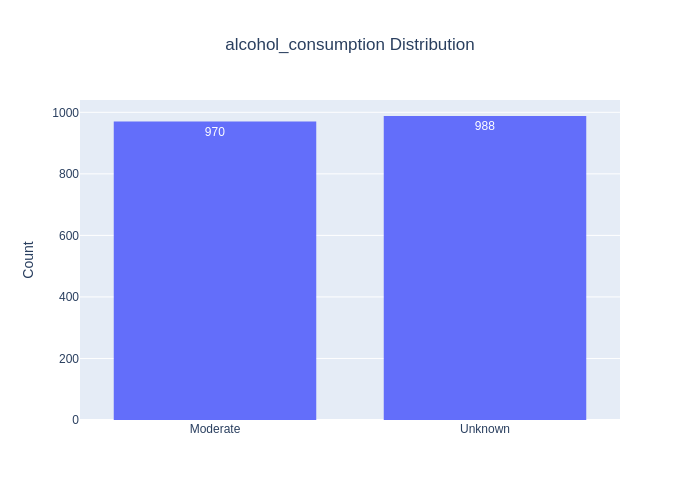

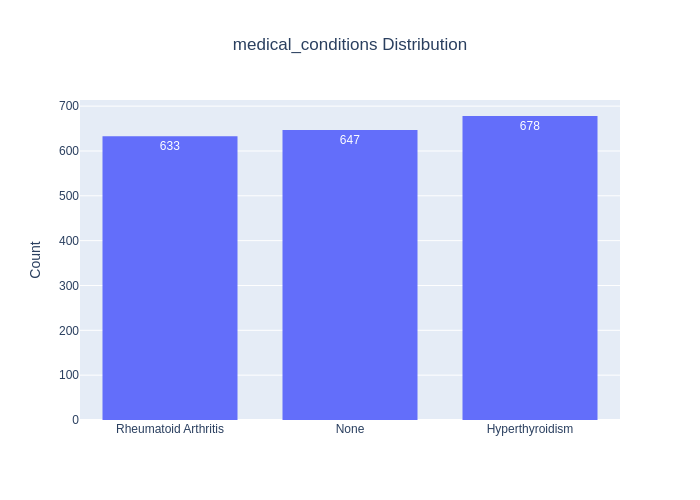

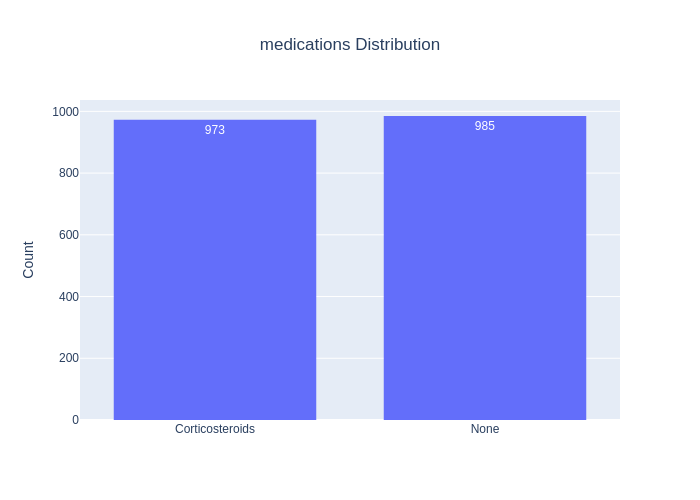

In [31]:
# Plotly Visualize the cols with missing values cols_with_missing
for col in cols_with_missing:
    fig = px.histogram(
        df_osteo,
        x=col,
        color_discrete_sequence=[COLOR_DISCRETE_SEQUENCE[1]],
        title=f"{col} Distribution",
        text_auto=True,
    )

    fig.update_layout(
        xaxis_title=None,
        yaxis_title="Count",
        title_x=0.5,
        bargap=0.25,
    )

    show_plot(fig)


### Key Insights — Categorical Features 💡

Analysis of the 13 categorical variables (1,958 patients) reveals several important patterns relevant to osteoporosis risk modeling:

1. **Gender & Hormonal Status:**

   * The dataset is roughly balanced by gender (**Male: 992, Female: 966**).
   * Hormonal changes are mostly “Normal” (**981 patients**), with the remainder postmenopausal.
   * These factors are critical predictors given the known role of sex hormones in bone density.

2. **Family History & Race/Ethnicity:**

   * Family history of osteoporosis is slightly skewed towards “No” (**998 patients**).
   * The cohort includes three main racial/ethnic groups, with **African Americans** most frequent (**681 patients**).
   * These variables provide demographic context and may influence baseline risk.

3. **Lifestyle Factors:**

   * **Body Weight:** Majority are “Normal” (**1027 patients**), highlighting the need to examine BMI-related risk patterns.
   * **Calcium Intake:** Most report “Low” (**1004 patients**).
   * **Vitamin D Intake:** Slightly more report “Sufficient” (**1011 patients**).
   * **Physical Activity:** More patients are “Active” (**1021 patients**).
   * **Smoking:** Balanced distribution (**Yes: 982, No: 976**).
   * **Alcohol Consumption:** Data available for 970 patients, but after missing-value imputation, 988 patients are labeled “Unknown,” indicating substantial missingness or non-disclosure. Only 2 distinct values are recorded across the cohort.

4. **Medical Conditions & Medications:**

   * **Medical Conditions:** Data available for 1,311 patients; “Hyperthyroidism” is most frequent (**678 patients**). A total of 3 distinct categories are present, with missing entries replaced by None.
   * **Medications:** Only 973 records originally available, all “Corticosteroids.” After imputation, 985 patients have “None,” suggesting missing or non-reported medication use, with only 2 categories in the dataset.

5. **Prior Fractures:**

   * Roughly balanced (**Yes: 983, No: 975**), reflecting a clinically relevant predictor for osteoporosis.

---

**Implications for Modeling:**

* Most categorical features are **binary or low-cardinality**, simplifying encoding and reducing dimensionality.
* Missingness in **alcohol_consumption, medical_conditions, and medications** will require careful handling during preprocessing.
* Balanced distributions in **gender, prior fractures, and smoking** reduce the risk of class imbalance for these predictors.
* Clinical and lifestyle factors captured here are consistent with known osteoporosis risk profiles, supporting model interpretability and feature importance analyses.
* Feature preprocessing can focus on clinical and lifestyle predictors without concern for dataset sparsity or missingness.

### 2.5.3 Feature Categorization: Clinical vs Lifestyle Factors

| Feature Category | Feature Name                   | Description / Relevance to Osteoporosis Risk                |
|-----------------|--------------------------------|------------------------------------------------------------|
| **Clinical**     | Age                            | Older age increases fracture risk due to bone density loss |
|                 | Gender                         | Females, especially postmenopausal, are at higher risk     |
|                 | Hormonal Changes               | Postmenopausal status affects estrogen, impacting bone density |
|                 | Family History                 | Genetic predisposition to osteoporosis                     |
|                 | Medical Conditions             | E.g., Hyperthyroidism, Rheumatoid Arthritis; chronic diseases affecting bones |
|                 | Medications                    | E.g., Corticosteroids, which reduce bone density           |
|                 | Prior Fractures                | History of fractures indicates compromised bone strength  |
|                 | Body Weight                    | Underweight increases risk of bone loss                   |
| **Lifestyle**    | Calcium Intake                 | Adequate intake supports bone health                      |
|                 | Vitamin D Intake               | Supports calcium absorption and bone mineralization       |
|                 | Physical Activity              | Weight-bearing exercise strengthens bones                 |
|                 | Smoking                        | Tobacco use decreases bone density                         |
|                 | Alcohol Consumption            | Excess alcohol increases fracture risk                     |

> **Key Insights:**  
> Structured clinical features capture inherent or medical risk factors, while lifestyle features capture modifiable behaviors. Both sets are critical for building predictive models and informing targeted interventions.


### 2.5.3 Visualizing Characteristics of the Dataset

### 2.5.3.1 Univariate

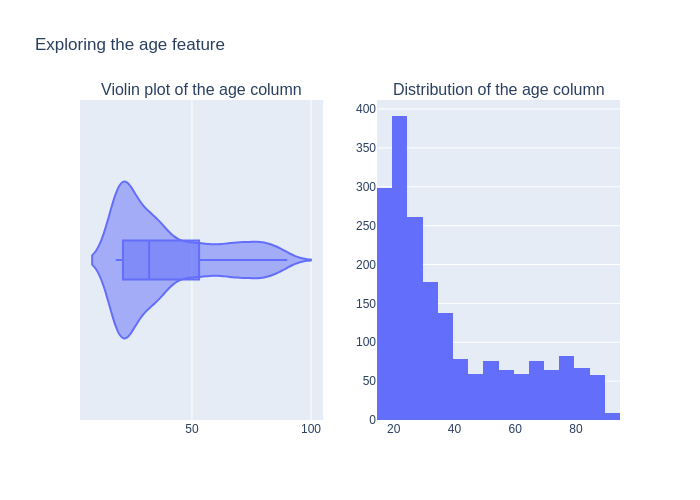

In [32]:
# Visualize their distributions
for column in df_osteo[numerical_cols].columns:
    fig1 = px.violin(df_osteo, x=column, box=True)

    fig2 = px.histogram(df_osteo, x=column)

    # Create a subplot layout with 1 row and 2 columns
    fig = make_subplots(rows=1, cols=2, subplot_titles=(f"Violin plot of the {column} column",
                                                    f"Distribution of the {column} column"))

    # Add traces from fig1 to the subplot
    for trace in fig1.data:
        fig = fig.add_trace(trace, row=1, col=1)

    # Add traces from fig2 to the subplot
    for trace in fig2.data:
        fig = fig.add_trace(trace, row=1, col=2)

    # Update layout
    fig = fig.update_layout(title_text=f"Exploring the {column} feature",
                        showlegend=True,
                        legend_title_text=target_col
    )

    show_plot(fig)

### Key Insight — Age Distribution and Clinical Implications 💡

* The **age distribution** spans from **18 to 90 years**, with a **mean of 39.1 years**, **median of 32 years**, and a **standard deviation of 21.36 years**, indicating **high variability** in patient ages.
* Both the **violin** and **histogram** plots reveal a **right-skewed distribution**, with the majority of participants clustered between **18–40 years**, suggesting a **predominantly younger cohort**.
* Despite this skew, a **notable subset of patients aged 60+** represents the **clinically critical segment** most at risk for osteoporosis.
* This variability supports the inclusion of **age as a continuous predictor** and highlights the need for **age-stratified feature analysis** to uncover nonlinear relationships between aging and bone fragility.

**Implication for Modeling:**
Machine learning models should **capture both linear and nonlinear effects of age** — potentially via age groups, polonomial terms, interaction terms or tree-based models — to ensure accurate risk prediction across diverse age groups.


### 2.5.3.2 Bivariate

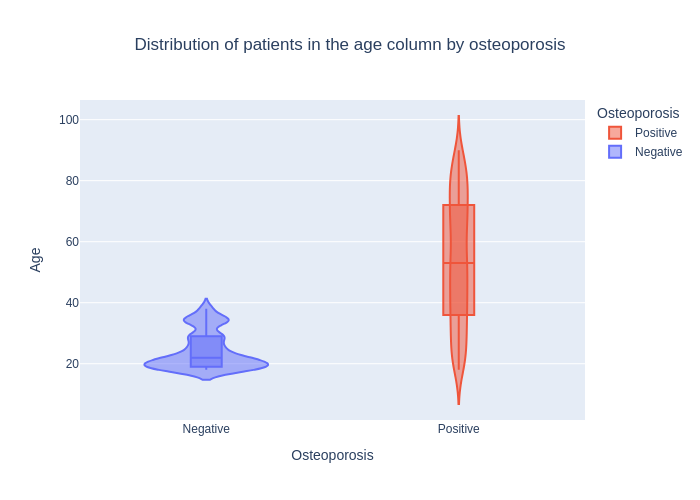

In [33]:
for column in numerical_cols:
    # Visualizing the distribution of the numericals in the columns by osteoporosis
    fig = px.violin(
        df_osteo,
        x=target_col,
        y=column,
        color=target_col,
        color_discrete_sequence=COLOR_DISCRETE_SEQUENCE,
        box=True,
        title=f"Distribution of patients in the {column} column by {target_col}"
    )

    fig.update_layout(
        xaxis_title=target_col.capitalize(),
        yaxis_title=column.capitalize(),
        legend_title_text=target_col.capitalize(),
        title_x=0.5,
    )

    fig = rename_legend(fig)
    fig = rename_xaxis(fig)

    show_plot(fig)

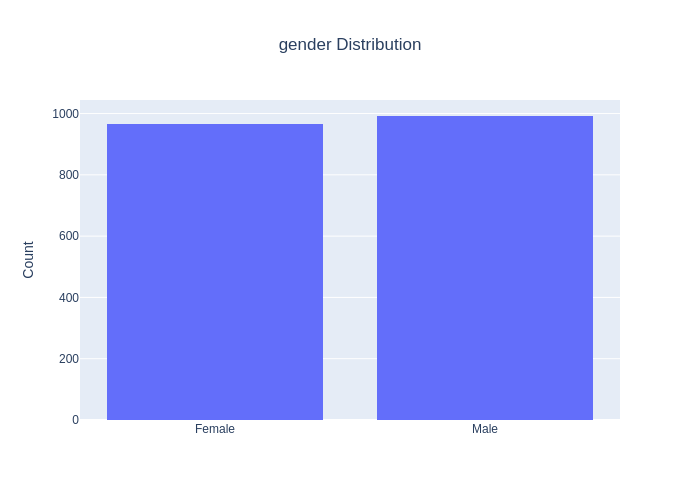

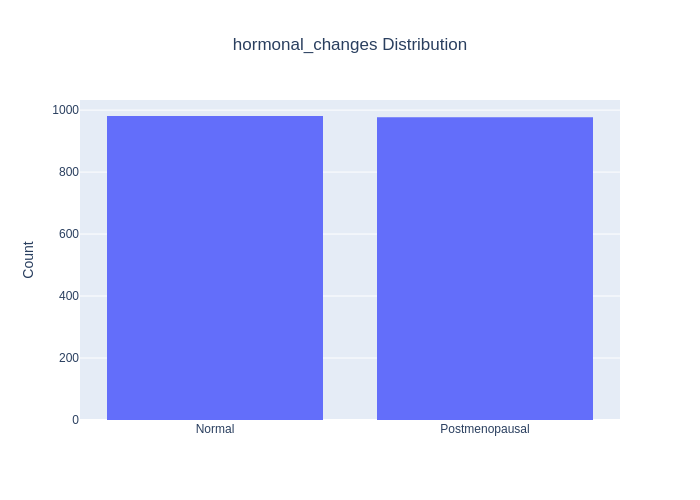

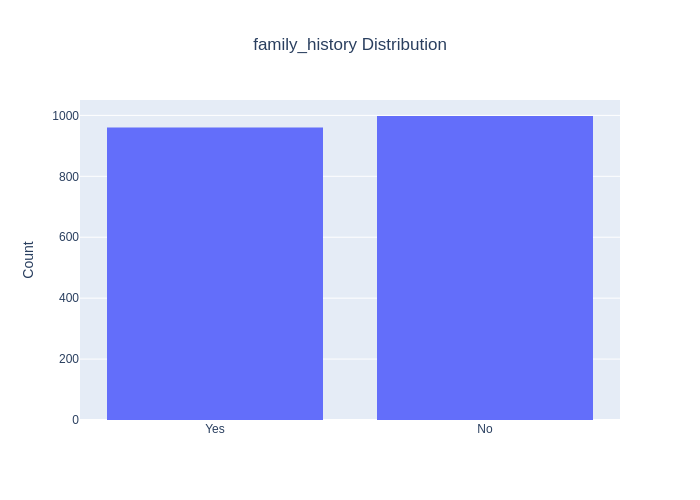

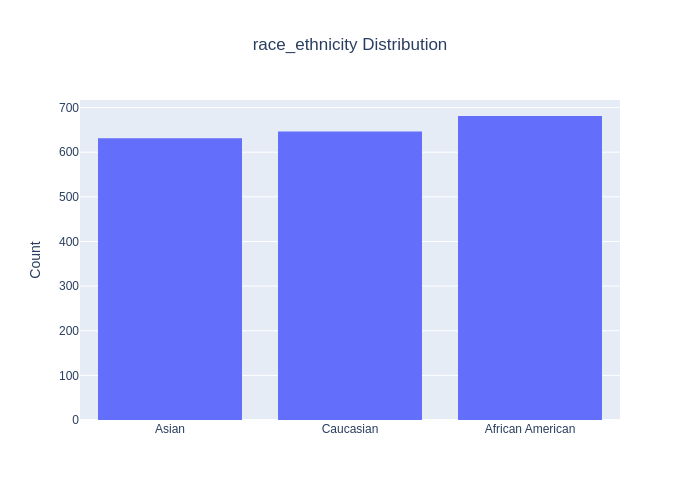

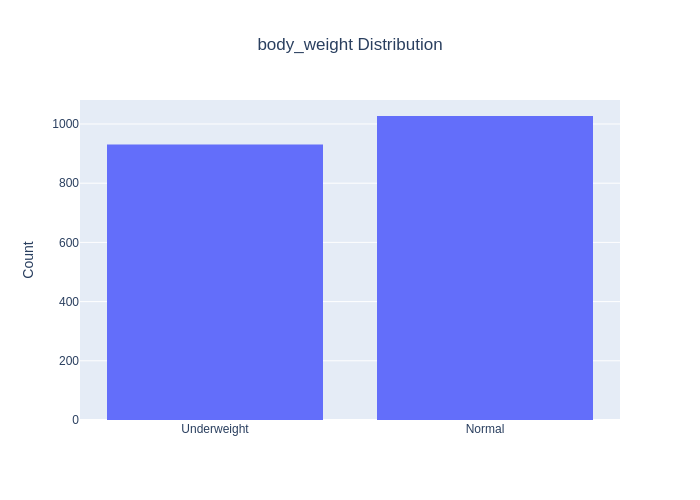

...

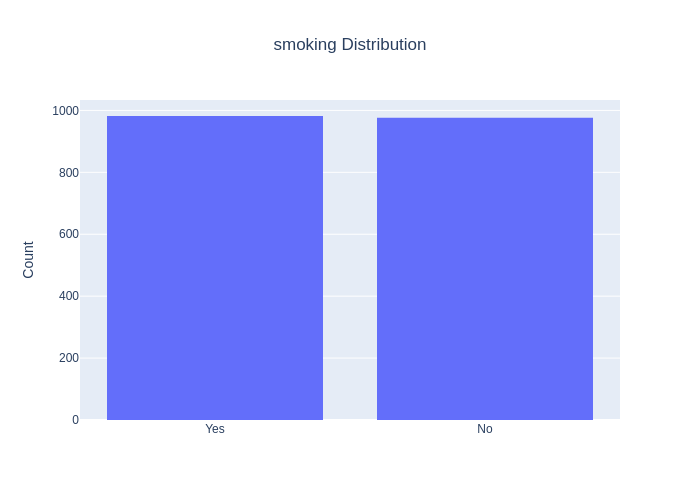

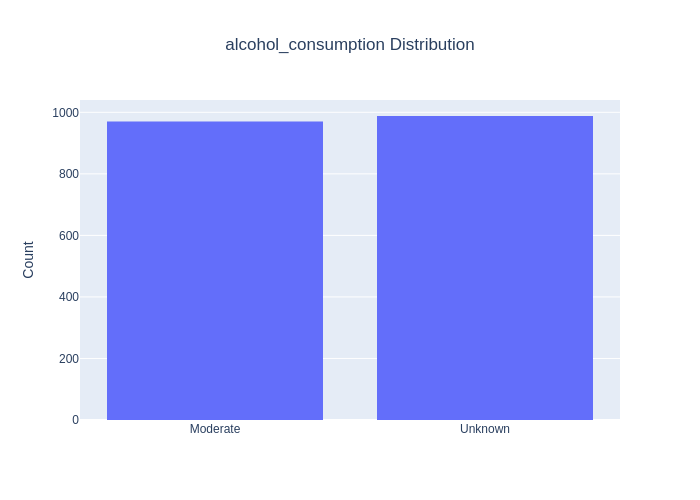

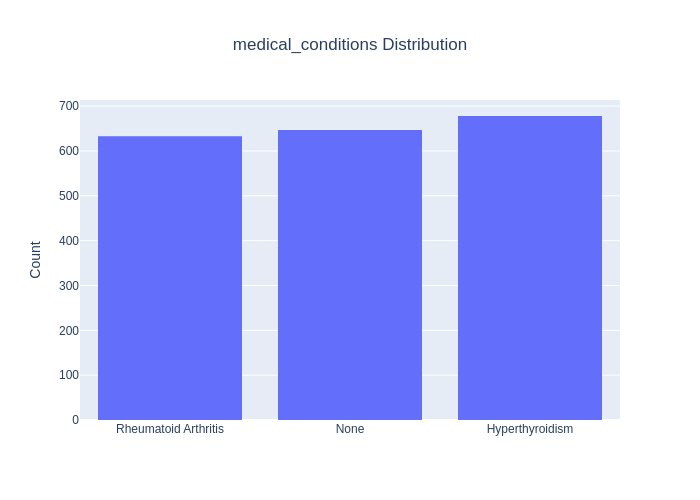

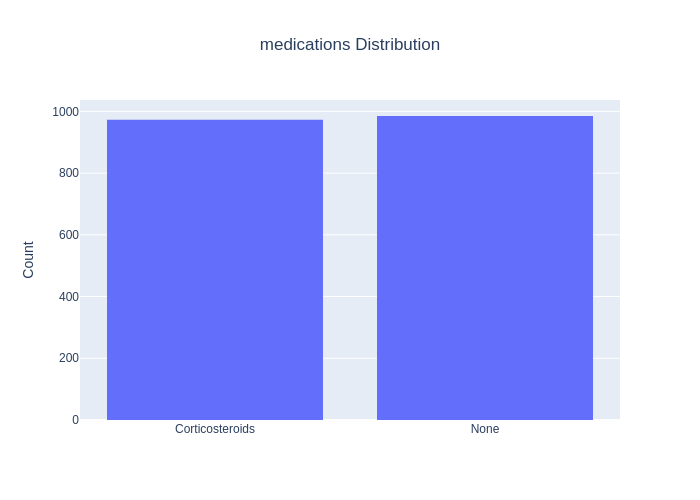

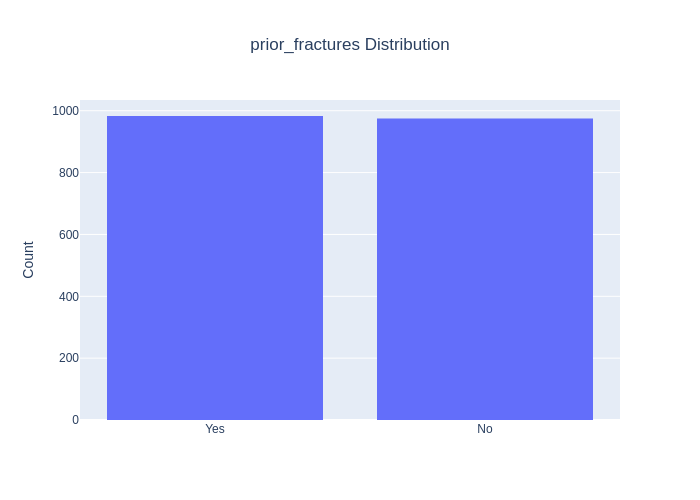

In [34]:
for col in categorical_cols:
    fig = px.histogram(
        df_osteo,
        x=col,
        color_discrete_sequence=[COLOR_DISCRETE_SEQUENCE[1]],
        title=f"{col} Distribution",
    )
    fig.update_layout(
        xaxis_title=None,
        yaxis_title="Count",
        title_x=0.5,
        bargap=0.2,
    )
    show_plot(fig)

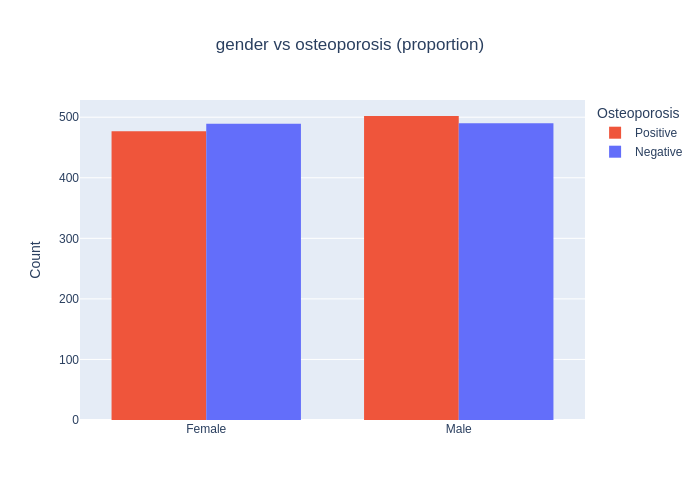

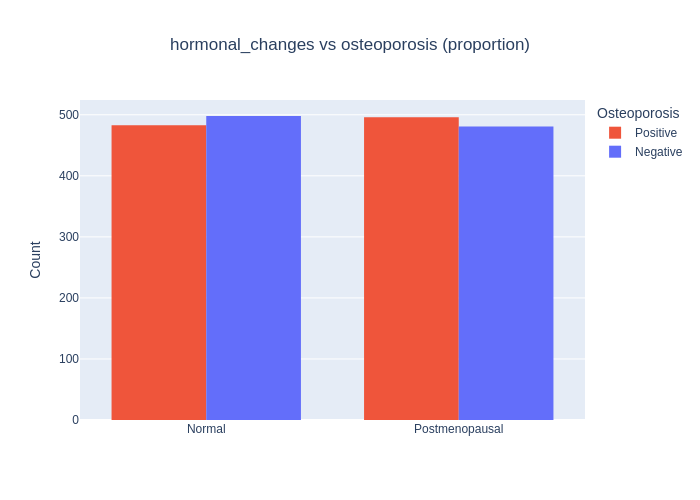

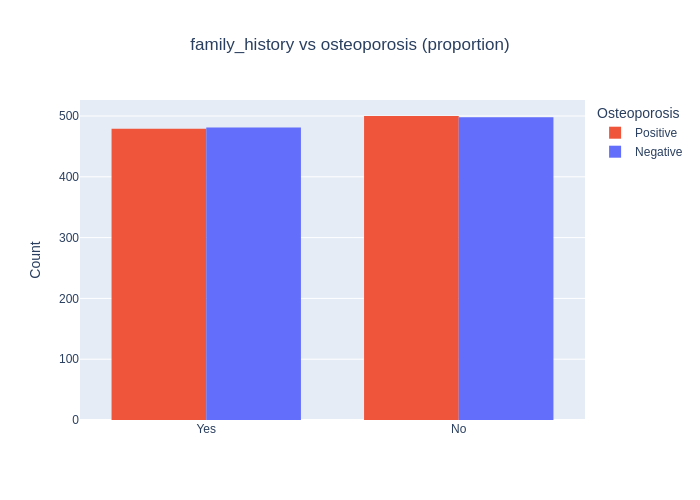

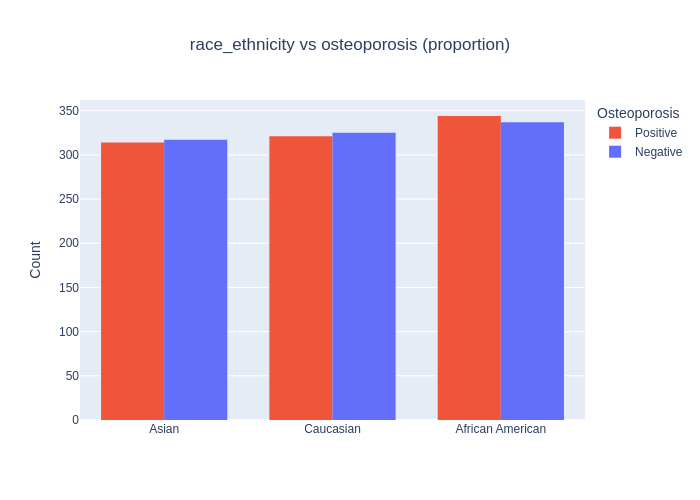

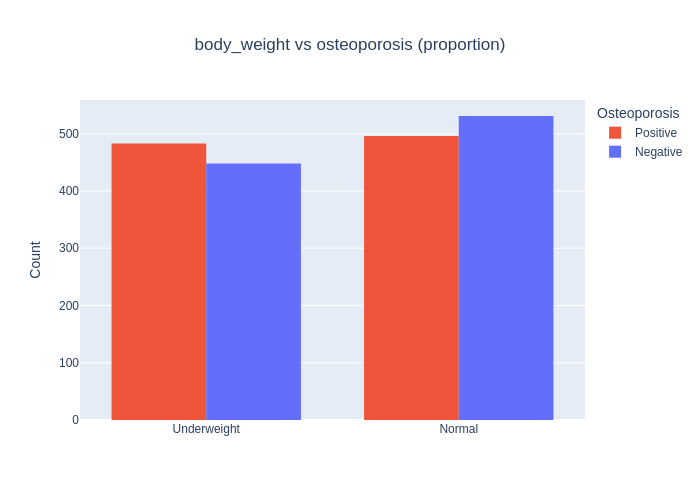

...

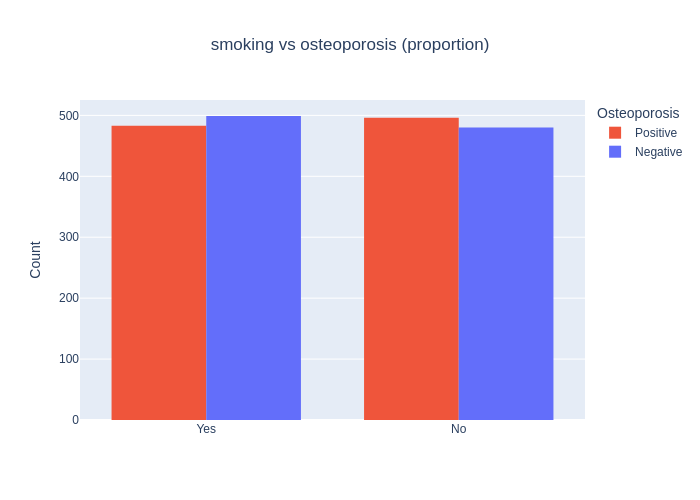

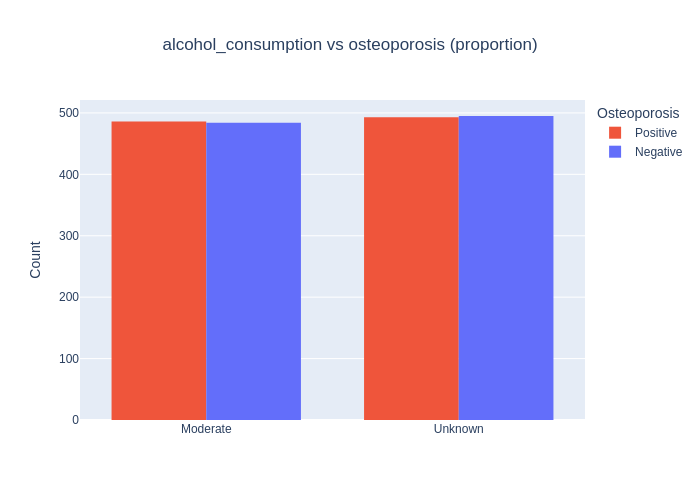

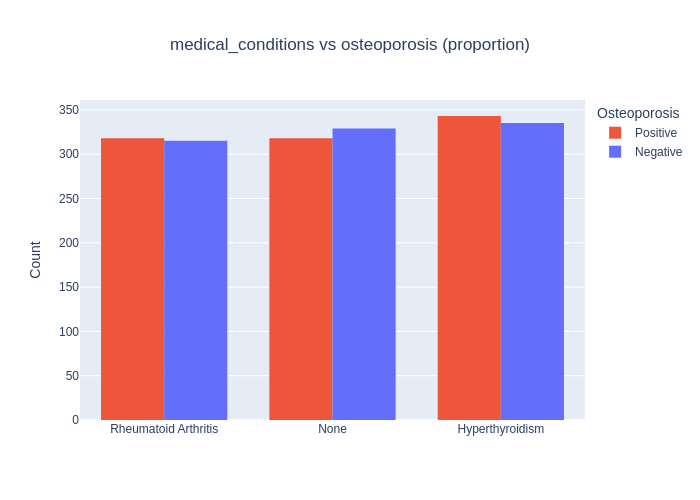

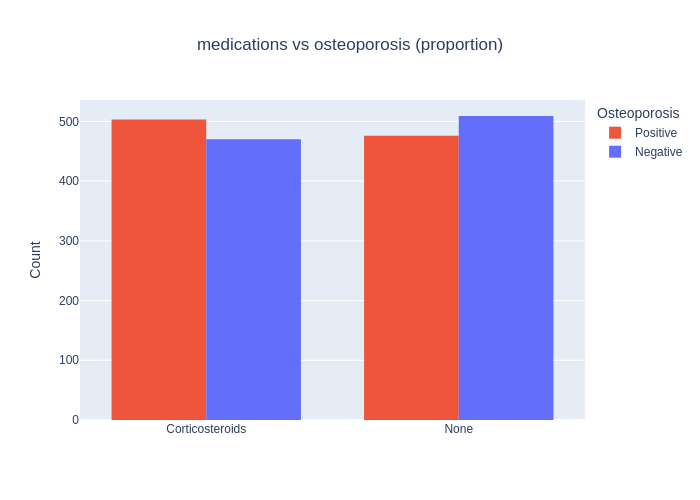

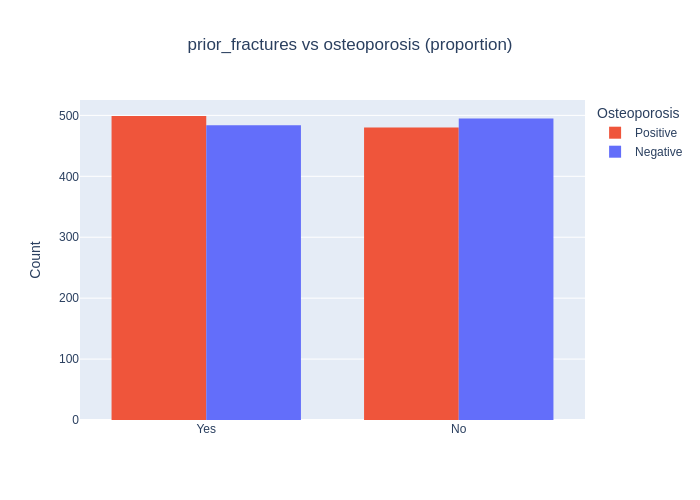

In [35]:
for col in categorical_cols:
    fig = px.histogram(
        df_osteo,
        x=col,
        color=target_col,
        barmode="group",
        color_discrete_sequence=COLOR_DISCRETE_SEQUENCE,
        title=f"{col} vs {target_col} (proportion)",
    )
    fig.update_layout(
        xaxis_title=None,
        yaxis_title="Count",
        title_x=0.5,
        bargap=0.25,
        legend_title_text=target_col.capitalize()
    )
    fig = rename_legend(fig)
    show_plot(fig)


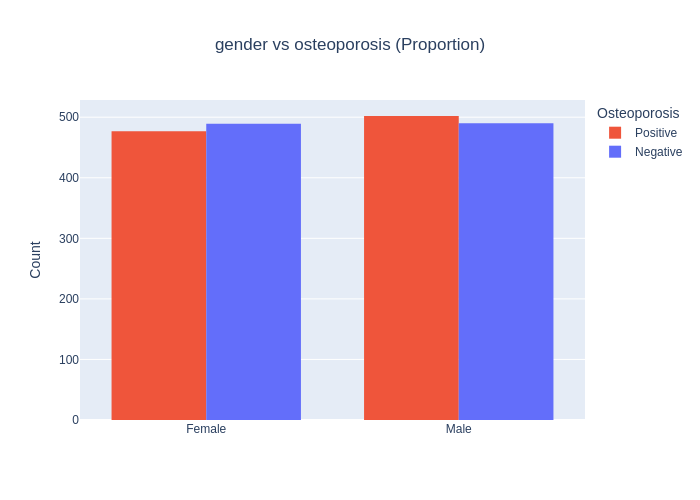

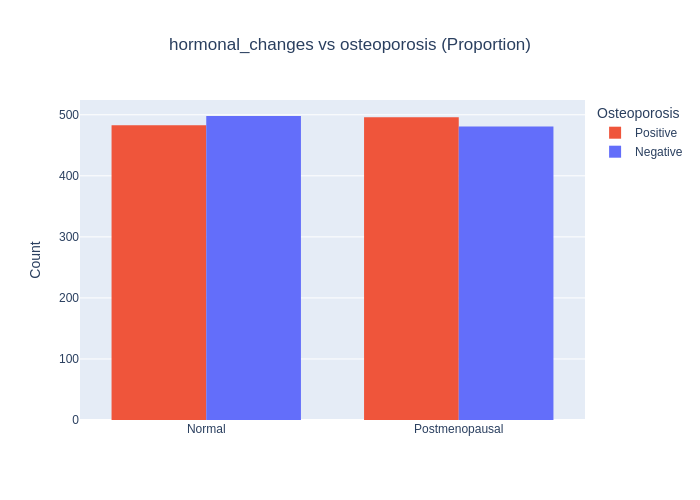

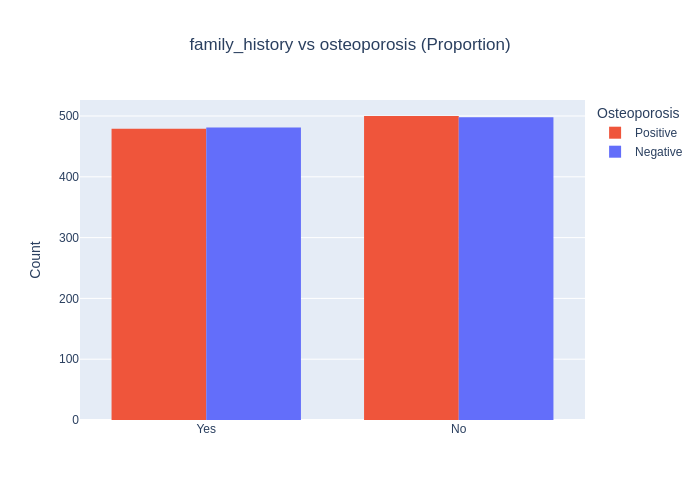

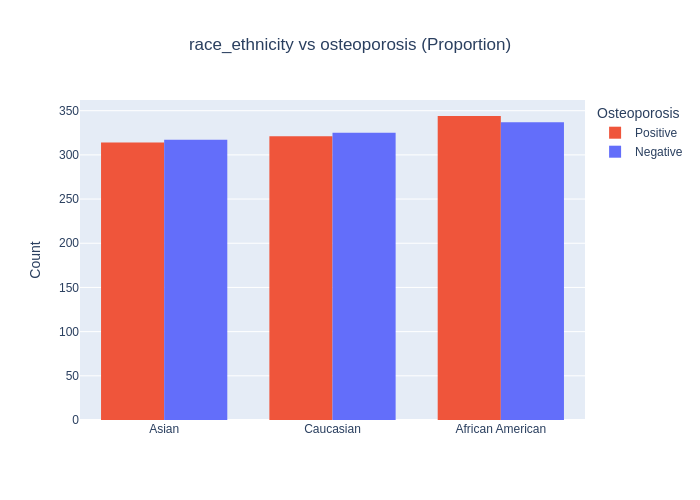

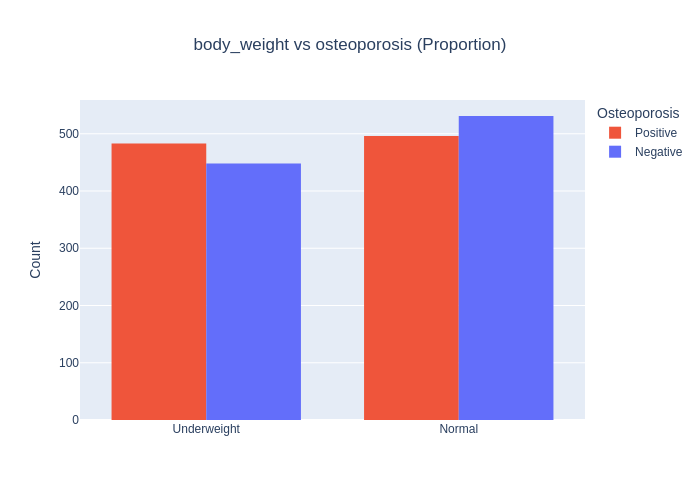

...

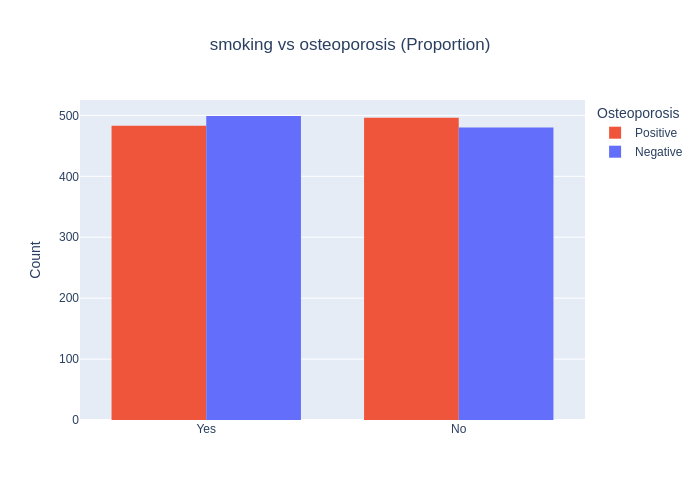

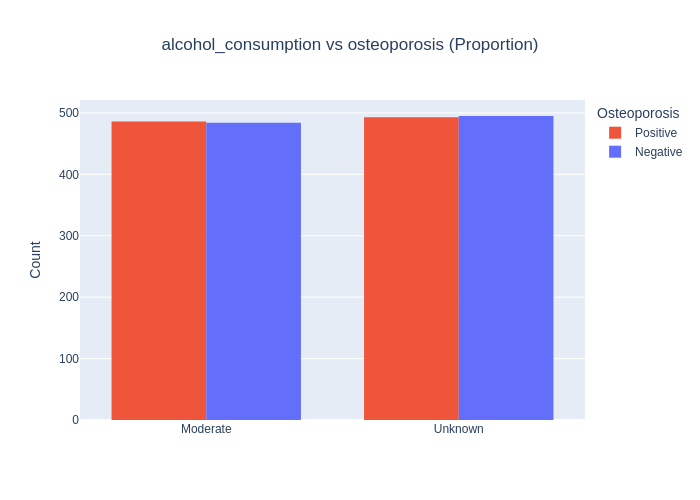

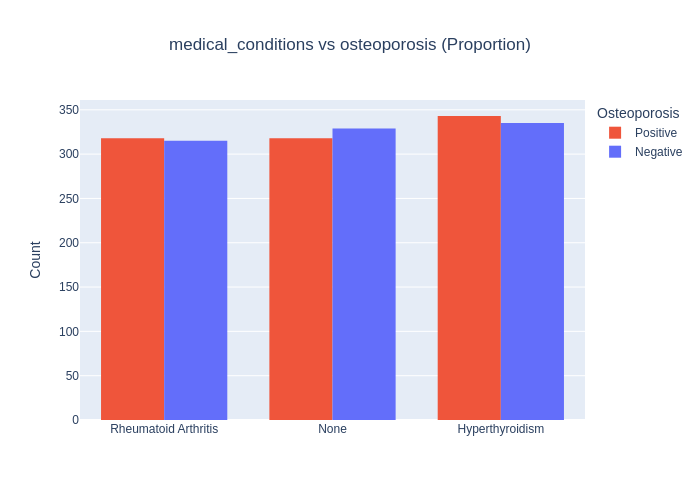

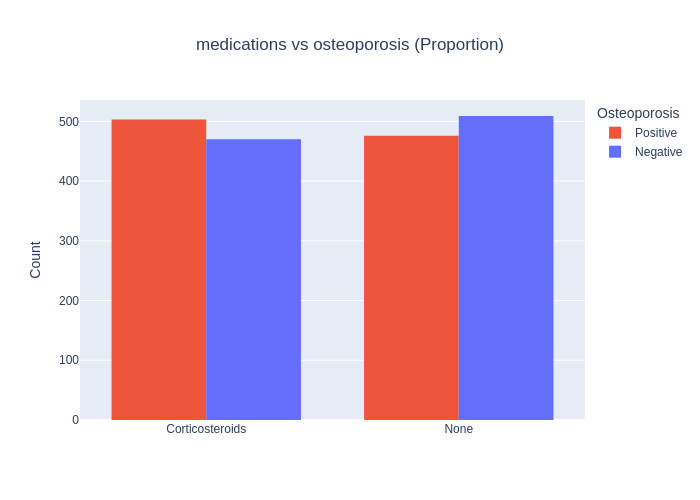

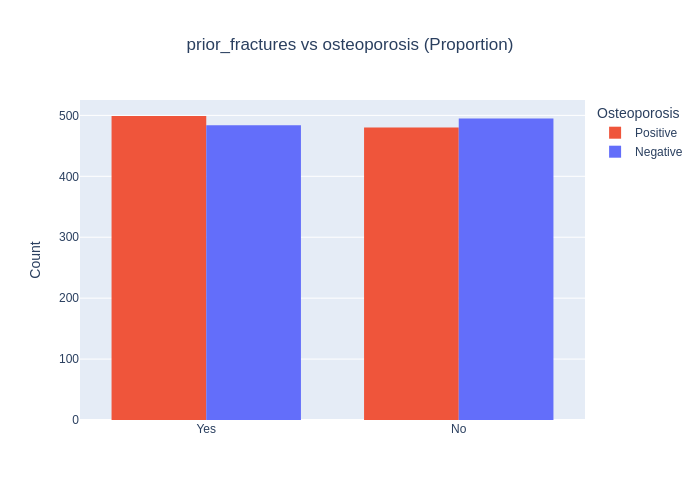

In [36]:
for col in categorical_cols:
    fig = px.histogram(
        df_osteo,
        x=col,
        color=target_col,
        barmode="group",
        color_discrete_sequence=COLOR_DISCRETE_SEQUENCE,
        title=f"{col} vs osteoporosis (Proportion)",
    )
    fig.update_layout(
        xaxis_title=None,
        yaxis_title="Count",
        title_x=0.5,
        bargap=0.25,
        legend_title_text=target_col.capitalize()
    )
    fig = rename_legend(fig)
    show_plot(fig)


## 2.5.3.3 Multivariate

In [130]:
def cramers_v(x: pd.Series, y: pd.Series) -> float:
    """
    Compute Cramér's V between two categorical series (string-cast).
    Returns 0.0 for degenerate inputs or when denominator is zero.
    """
    x = x.astype(str)
    y = y.astype(str)
    confusion = pd.crosstab(x, y)
    if confusion.size == 0:
        return 0.0
    chi2, _, _, _ = chi2_contingency(confusion, correction=False)
    n = confusion.values.sum()
    if n == 0:
        return 0.0
    phi2 = chi2 / n
    r, k = confusion.shape
    # bias correction (Bergsma and Wicher)
    phi2corr = max(0.0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1) ** 2) / (n - 1)
    kcorr = k - ((k - 1) ** 2) / (n - 1)
    denom = min(kcorr - 1, rcorr - 1)
    return float(np.sqrt(phi2corr / denom)) if denom > 0 else 0.0


def cramers_v_matrix(df: pd.DataFrame, cols: Iterable[str]) -> pd.DataFrame:
    """
    Compute symmetric Cramér's V matrix for given categorical columns.
    Returns a DataFrame indexed and columned by cols with values in [0,1].
    """
    cols = list(cols)
    mat = pd.DataFrame(np.zeros((len(cols), len(cols))), index=cols, columns=cols, dtype=float)
    for i, a in enumerate(cols):
        for j in range(i, len(cols)):
            b = cols[j]
            v = cramers_v(df[a], df[b])
            mat.at[a, b] = v
            mat.at[b, a] = v
    return mat


def plot_cramers_bar_plotly(assoc_df: pd.DataFrame, title: str = "Association Strength with Target (Cramér's V)") -> go.Figure:
    """
    Create and return a Plotly horizontal bar Figure of Variable vs Cramér's V.
    Expects assoc_df with columns ['Variable','Cramer_V'].
    """
    df_sorted = assoc_df.sort_values("Cramer_V", ascending=True).reset_index(drop=True)
    fig = px.bar(
        df_sorted,
        x="Cramer_V",
        y="Variable",
        orientation="h",
        color="Cramer_V",
        color_continuous_scale="Viridis",
        range_color=(0, 1),
        title=title,
        height=max(400, 30 * df_sorted.shape[0])
    )
    fig.update_layout(xaxis_title="Cramér's V", yaxis_title=None, title_x=0.5, showlegend=False)
    return fig


def plot_cramers_heatmap_plotly(mat: pd.DataFrame, title: str = "Cramér's V heatmap") -> go.Figure:
    """
    Create and return a Plotly heatmap Figure for a symmetric Cramér's V matrix.
    Rows and columns use mat.index/columns; values expected in 0..1.
    """
    labels_x = mat.columns.tolist()
    labels_y = mat.index.tolist()
    z = mat.values.astype(float)

    fig = go.Figure(data=go.Heatmap(
        z=z,
        x=labels_x,
        y=labels_y,
        colorscale="Viridis",
        colorbar=dict(title="Cramér's V"),
        texttemplate='%{z:.3f}',
        hovertemplate="Variable X: %{y}<br>Variable Y: %{x}<br>Cramér's V: %{z:.2f}<extra></extra>"
    ))

    fig.update_layout(
        title=title,
        xaxis=dict(tickangle=45),
        height=max(600, 20 * len(labels_y)),
        width=max(900, 20 * len(labels_x)),
        margin=dict(l=200 if len(labels_y) > 30 else 120, r=120, t=80, b=120),
    )
    return fig

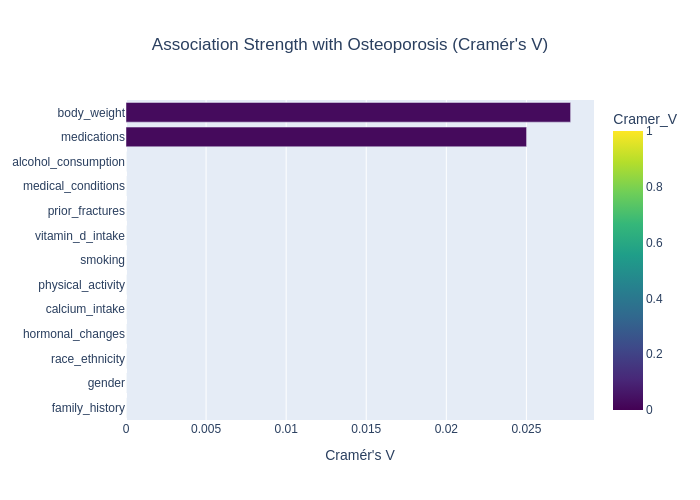

In [110]:
# Per-variable association with target (bar)
assoc: Dict[str, float] = {col: cramers_v(df_osteo[col], df_osteo[target_col]) for col in categorical_cols}
assoc_df = pd.DataFrame(list(assoc.items()), columns=["Variable", "Cramer_V"]).sort_values("Cramer_V", ascending=False).reset_index(drop=True)
fig = plot_cramers_bar_plotly(assoc_df, title="Association Strength with Osteoporosis (Cramér's V)")
show_plot(fig)

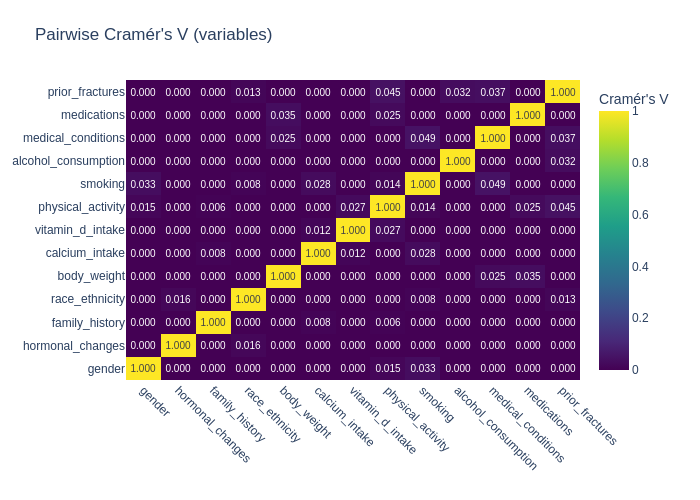

In [131]:
# Pairwise variable heatmap (matrix)
var_mat = cramers_v_matrix(df_osteo, categorical_cols)
fig = plot_cramers_heatmap_plotly(var_mat, title="Pairwise Cramér's V (variables)")
show_plot(fig)

### Key finding

- The variables are largely independent: most pairwise Cramér’s V values are near zero, indicating minimal association across domains; the strongest off‑diagonal links are modest (max ~0.05), so no pair dominates.

### Insight

- The dataset supports orthogonal modeling: predictors provide largely distinct information, reducing multicollinearity risk but increasing the need to preserve many categorical features to retain signal.

### Implications

- A compact feature collapse based on pairwise association is unlikely to preserve performance because few variables are redundant.  
- Small nonzero associations (e.g., physical_activity ↔ prior_fractures 0.04; medical_conditions ↔ smoking 0.05; body_weight ↔ medical_conditions/medications 0.03) suggest targeted interaction tests rather than wholesale aggregation.  
- Diagonal = 1 confirms calculation integrity and that variables are correctly categorical.

### Recommendations

1. Preserve granularity for most categorical features; avoid aggressive collapsing unless driven by low counts or domain rationale.  
2. In modeling, include interaction terms for the handful of modest associations to test incremental predictive value (e.g., smoking × medical_conditions; physical_activity × prior_fractures).  
3. If dimensionality reduction is desired, prefer supervised selection (feature importance from cross‑validated models) rather than unsupervised collapse driven by these low associations.

Variables are mostly independent; keep features granular, test a few targeted interactions, and rely on supervised selection or regularization to build performant, interpretable models.

In [60]:
def fit_mca(
    df: pd.DataFrame,
    categorical_cols: List[str],
    n_components: int = 18,
    random_state: int = 2025,
    n_iter: int = 5,
    engine: str = 'scipy',
    check_input: bool = True,
    copy: bool = True
) -> MCA:
    """
    Fit a Multiple Correspondence Analysis (MCA) model and return the fitted MCA object.

    Parameters
    ----------
    df :
        DataFrame containing the dataset used for fitting.
    categorical_cols :
        List of column names in `df` to treat as categorical variables for MCA.
        Order must match any subsequent transforms you perform.
    n_components :
        Number of MCA components to compute. Choose <= sum(k_j - 1) where k_j are variable levels.
    random_state :
        RNG seed passed to MCA for reproducibility.
    n_iter :
        Maximum iterations for the MCA algorithm (implementation-specific).
    engine :
        Backend/engine name accepted by the MCA implementation (commonly 'scipy').
    check_input :
        If True, MCA may validate inputs; keep False only for advanced uses.
    copy :
        If True, MCA will copy inputs internally.

    Returns
    -------
    MCA
        A fitted MCA object (type depends on the imported MCA implementation).

    Notes
    -----
    - The function fits MCA on `df[categorical_cols]` and does not modify `df`.
    - Columns in `categorical_cols` must exist in `df` and should be categorical or string/object typed.
    - For supervised pipelines, fit MCA on training folds only to avoid data leakage.
    - Use `transform_rows` and `get_coords` to extract row scores and category coordinates respectively.
    """
    mca = MCA(
        n_components=n_components,
        n_iter=n_iter,
        copy=copy,
        check_input=check_input,
        engine=engine,
        random_state=random_state
    ).fit(df[categorical_cols])
    return mca


def transform_rows(mca: MCA, df: pd.DataFrame, categorical_cols: List[str], target_col: str) -> pd.DataFrame:
    """
    Transform rows to principal coordinates (row factor scores) and append a target column.

    Parameters
    ----------
    mca :
        Fitted MCA object returned by `fit_mca`.
    df :
        Original DataFrame used for fitting (or the dataset you want transformed).
    categorical_cols :
        Columns used when fitting `mca` (must be in the same order and types).
    target_col :
        Name of a column in `df` to append to the returned DataFrame for coloring/labeling.

    Returns
    -------
    pd.DataFrame
        DataFrame with columns ['Dim1', 'Dim2', ..., 'DimK', target_col'] where K is the number
        of components. Index is a simple RangeIndex aligned with `df`.

    Behavior
    --------
    - The returned Dim columns are floats representing row coordinates on each MCA axis.
    - The `target_col` preserves its original dtype from `df`.
    - Raises KeyError if `target_col` is missing in `df`.

    Use cases
    ---------
    - Plotting the row cloud (scatter/biplot).
    - Coloring row points by `target_col` for exploratory analysis.
    """
    rows = mca.transform(df[categorical_cols]).copy()
    rows.columns = [f"Dim{i+1}" for i in range(rows.shape[1])]
    rows = rows.reset_index(drop=True)
    rows[target_col] = df[target_col].values
    return rows


def get_coords(mca: MCA, df: pd.DataFrame, categorical_cols: List[str]) -> pd.DataFrame:
    """
    Retrieve category (column) principal coordinates (column factor scores).

    Parameters
    ----------
    mca :
        Fitted MCA object.
    df :
        DataFrame used for fitting; passed because some MCA implementations require data on call.
    categorical_cols :
        Columns used when fitting `mca`.

    Returns
    -------
    pd.DataFrame
        DataFrame indexed by (variable, level) (MultiIndex) containing coordinates per component:
        columns = ['Dim1', 'Dim2', ..., 'DimK'].

    Notes
    -----
    - `coords.loc[(var, level), 'Dim1']` returns the coordinate of the category level on Dim1.
    - Some implementations may return single-level string labels instead of a MultiIndex. Downstream helpers
      (e.g., compute_masses_aligned) attempt to parse common formats.
    """
    coords = mca.column_coordinates(df[categorical_cols]).copy()
    coords.columns = [f"Dim{i+1}" for i in range(coords.shape[1])]
    return coords


def compute_masses_aligned(df: pd.DataFrame, coords: pd.DataFrame) -> pd.Series:
    """
    Compute category masses (relative frequencies) aligned to coords.index.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame used to compute counts. This should be the same DataFrame
        used (or intended) to fit the MCA model and contain the categorical columns.
    coords : pd.DataFrame
        Category coordinates DataFrame returned by `get_coords`. Its index may be:
        - a MultiIndex of (variable, level), or
        - a single-level Index of string labels that encode the pair (common patterns parsed:
          '__', ':', '=', ' - ').

    Returns
    -------
    pd.Series
        Series indexed identically to `coords.index` (MultiIndex of (variable, level)).
        Values equal count(level in variable) / n_rows. For a non-empty `df` the values
        should sum approximately to 1.0.

    Behavior and parsing
    --------------------
    - If `coords.index` is a MultiIndex the (variable, level) pairs are used directly.
    - If `coords.index` is single-level strings the function attempts to parse in this order:
      1. double underscore pattern 'variable__level' (common with prince)
      2. colon 'variable:level'
      3. equals 'variable=level'
      4. dash 'variable - level'
      5. fallback: first whitespace token as variable and remainder as level
    - Matching is performed using string representations (both `df[var].astype(str)` and the
      parsed `level` are cast to `str`) to avoid mismatches caused by dtype differences
      (e.g., pd.Categorical vs str), stray whitespace, or minor formatting differences.
    - If a variable name parsed from `coords` does not exist in `df`, its levels are treated
      as having zero counts.

    Edge cases and safety
    ---------------------
    - If `df` has zero rows the function avoids division by zero and returns masses that sum to 0.
    - Levels absent in `df` receive mass 0.
    - The returned Series is reindexed to match `coords.index` exactly and any missing entries
      are filled with 0.0 to preserve ordering.

    Validation and debugging tips
    -----------------------------
    - Confirm `masses.sum()` ≈ 1.0 for non-empty `df`.
    - If many masses are zero:
      1. Print a sample of `coords.index` to inspect formatting.
      2. Compare `df[col].astype(str).unique()` for suspect variables to find mismatches.
      3. Manually verify lookups with:
         df[col].astype(str).value_counts().get(str(level), 0)
    - Ensure the same DataFrame (rows and encodings) used to fit MCA is passed to this function.

    Interpretation
    --------------
    - Use the returned masses to compute eigenvalues and category contributions:
      eigenvalue_j = sum_i mass_i * coord_{i,j}^2
      contrib_{i,j}  = mass_i * coord_{i,j}^2 / eigenvalue_j

    Examples
    --------
    coords.index sample (single-level):
      ['gender__Female', 'gender__Male', 'smoking__Yes', ...]
    >>> masses = compute_masses_aligned(df, coords)
    >>> masses.loc[('gender','Female')]  # -> proportion of rows with gender == 'Female'

    coords.index sample (MultiIndex):
      MultiIndex([('gender','Female'), ('gender','Male'), ('smoking','Yes'), ...])
    >>> masses = compute_masses_aligned(df, coords)
    >>> masses.loc[('smoking','Yes')]  # -> proportion of rows with smoking == 'Yes'
    """

    n_rows = max(1, df.shape[0])

    # Build (variable, level) pairs from coords.index
    if isinstance(coords.index, pd.MultiIndex):
        pairs = list(coords.index)
    else:
        pairs = []
        for lbl in coords.index:
            s = str(lbl)
            if '__' in s:                      # primary pattern produced by prince
                var, lvl = s.split('__', 1)
            elif ':' in s:
                var, lvl = s.split(':', 1)
            elif '=' in s:
                var, lvl = s.split('=', 1)
            elif ' - ' in s:
                var, lvl = s.split(' - ', 1)
            else:
                tokens = s.split()
                var, lvl = tokens[0], ' '.join(tokens[1:]) if len(tokens) > 1 else ''
            pairs.append((var.strip(), lvl.strip()))

    counts: Dict[Tuple[str, Any], int] = {}
    for var, lvl in pairs:
        if var in df.columns:
            vc = df[var].astype(str).value_counts(dropna=False)
            counts[(var, lvl)] = int(vc.get(str(lvl), 0))
        else:
            counts[(var, lvl)] = 0

    masses = pd.Series(counts, dtype=float) / n_rows
    masses.index = pd.MultiIndex.from_tuples(masses.index)
    masses = masses.reindex(pd.MultiIndex.from_tuples(pairs)).fillna(0.0)
    # Ensure ordering matches coords.index exactly (in case coords.index was single-level strings)
    masses = masses.reindex(pd.MultiIndex.from_tuples(
        [(v, l) for v, l in pairs] if isinstance(coords.index, pd.MultiIndex) else masses.index
    ))
    return masses


def compute_eigenvalues(mca: MCA, coords: pd.DataFrame, masses: pd.Series) -> np.ndarray:
    """
    Retrieve or compute MCA eigenvalues (inertia per component).

    Parameters
    ----------
    mca :
        Fitted MCA object; function will attempt to use `mca.eigenvalues_` or `mca.eigenvalues`.
    coords :
        Category coordinates DataFrame (index aligned with `masses`).
    masses :
        Series of category masses aligned to `coords.index`.

    Returns
    -------
    np.ndarray
        1-D array of eigenvalues (length = number of components).

    Logic
    -----
    - If the MCA object exposes eigenvalues (common attribute names tried), those are returned.
    - Otherwise eigenvalues are computed by the standard formula:
      eigenvalue_j = sum_i mass_i * coord_{i,j}^2

    Notes
    -----
    - Computed eigenvalues ensure contribution calculations work even if the MCA implementation
      does not expose the attribute.
    """
    eigen_attr1 = getattr(mca, "eigenvalues_", None)
    eigen_attr2 = getattr(mca, "eigenvalues", None)
    if eigen_attr1 is not None:
        return np.asarray(eigen_attr1, dtype=float)
    if eigen_attr2 is not None:
        return np.asarray(eigen_attr2, dtype=float)
    coords_sq = coords.pow(2)
    return (coords_sq.multiply(masses.values, axis=0)).sum(axis=0).to_numpy(dtype=float)


def compute_explained_inertia(mca: MCA, eigenvalues: np.ndarray) -> np.ndarray:
    """
    Retrieve or compute explained inertia (fraction of total inertia per component).

    Parameters
    ----------
    mca :
        Fitted MCA object; will try `mca.explained_inertia_` or `mca.explained_inertia`.
    eigenvalues :
        1-D numpy array of eigenvalues.

    Returns
    -------
    np.ndarray
        1-D array of explained inertia fractions (sums to 1.0 if eigenvalues valid).

    Behavior
    --------
    - Prefer precomputed attributes from `mca`.
    - Otherwise compute eigenvalues / eigenvalues.sum().
    """
    explained_attr1 = getattr(mca, "explained_inertia_", None)
    explained_attr2 = getattr(mca, "explained_inertia", None)
    if explained_attr1 is not None:
        return np.asarray(explained_attr1, dtype=float)
    if explained_attr2 is not None:
        return np.asarray(explained_attr2, dtype=float)
    total = eigenvalues.sum() if eigenvalues.size else np.nan
    return (eigenvalues / total) if (total and not np.isnan(total)) else np.full_like(eigenvalues, np.nan)


def compute_contribs(coords: pd.DataFrame, masses: pd.Series, eigenvalues: np.ndarray) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Compute per-category percent contributions and cos2 for MCA components.

    Parameters
    ----------
    coords :
        Category coordinates DataFrame indexed by (variable, level), columns = ['Dim1', ...].
    masses :
        Series of masses aligned to coords.index (should sum ~1).
    eigenvalues :
        1-D array of eigenvalues (length = number of components).

    Returns
    -------
    Tuple[pd.DataFrame, pd.DataFrame]
        - contrib_pct: DataFrame indexed like `coords`, columns ['Dim1', ...], values are percent
          contributions of each category to each component. For each component column,
          contrib_pct.sum() == 100.
        - cos2: DataFrame of squared cosines (quality of representation) with same index/columns.

    Formulae
    --------
    - contrib_{i,j} = mass_i * coord_{i,j}^2 / eigenvalue_j, normalized to percent per component.
    - cos2_{i,j} = coord_{i,j}^2 / sum_k coord_{i,k}^2.

    Interpretation guidance
    -----------------------
    - Use categories with both high contrib_pct and high cos2 when interpreting axes.
    - Sum contributions of a variable's levels to get variable-level influence.
    """
    coords_sq = coords.pow(2)
    eig_safe = np.where(eigenvalues == 0, np.nan, eigenvalues)
    contrib = coords_sq.divide(eig_safe, axis=1)
    contrib = contrib.multiply(masses.values, axis=0)
    contrib_pct = contrib.div(contrib.sum(axis=0), axis=1).multiply(100).fillna(0.0)

    coord_sq_sum = coords_sq.sum(axis=1).replace(0, np.nan)
    cos2 = coords_sq.divide(coord_sq_sum, axis=0).fillna(0.0)

    return contrib_pct, cos2


def fit_mca_and_contribs(
    df: pd.DataFrame,
    categorical_cols: List[str],
    target_col: str,
    n_components: int = 18,
    random_state: int = 2025,
    n_iter: int = 5,
    engine: str = 'scipy',
    check_input: bool = True,
    copy: bool = True
) -> Dict[str, Any]:
    """
    High-level wrapper: fit MCA and compute masses, eigenvalues, contributions and cos2.

    Parameters
    ----------
    df :
        Input DataFrame.
    categorical_cols :
        Columns to use as categorical predictors.
    target_col :
        Column name in `df` appended to row-scores for plotting/labeling.
    n_components, random_state, n_iter, engine, check_input, copy :
        Passed to `fit_mca`.

    Returns
    -------
    Dict[str, Any]
        Dictionary with keys:
          - "mca": fitted MCA object
          - "mca_components": pd.DataFrame of row-scores with columns ['Dim1', ...] and `target_col` appended
          - "coords": pd.DataFrame of category coordinates indexed by (variable, level)
          - "masses": pd.Series of category masses aligned to coords.index (sums ~1)
          - "eigenvalues": np.ndarray of eigenvalues
          - "explained_inertia": np.ndarray of explained inertia fractions
          - "contrib_pct": pd.DataFrame percent contributions per category × component
          - "cos2": pd.DataFrame squared cosines per category × component

    Best practices
    --------------
    - Fit on training data only to prevent leakage into supervised models.
    - Collapse rare categories prior to MCA if many levels have very low counts.
    - Validate `masses.sum()` (≈ 1.0) and inspect a sample of `masses` to confirm alignment.
    - Prefer categories with both high contribution and high cos2 when interpreting components.
    """
    mca = fit_mca(df, categorical_cols, n_components=n_components, random_state=random_state,
                  n_iter=n_iter, engine=engine, check_input=check_input, copy=copy)
    mca_components = transform_rows(mca, df, categorical_cols, target_col)
    coords = get_coords(mca, df, categorical_cols)
    masses = compute_masses_aligned(df, coords)
    eigenvalues = compute_eigenvalues(mca, coords, masses)
    explained_inertia = compute_explained_inertia(mca, eigenvalues)
    contrib_pct, cos2 = compute_contribs(coords, masses, eigenvalues)

    return {
        "mca": mca,
        "mca_components": mca_components,
        "coords": coords,
        "masses": masses,
        "eigenvalues": eigenvalues,
        "explained_inertia": explained_inertia,
        "contrib_pct": contrib_pct,
        "cos2": cos2
    }


In [61]:
# --- Fit MCA ---
n=18
mca_result = fit_mca_and_contribs(
    df_osteo,
    categorical_cols,
    target_col,
    n_components=n,
    random_state=RANDOM_STATE
)

mca = mca_result['mca']
mca_components = mca_result['mca_components']
coords = mca_result['coords']
contrib_pct = mca_result['contrib_pct']
cos2 = mca_result['cos2']
eigenvalues = mca_result['eigenvalues']
explained_inertia = mca_result['explained_inertia']
coords = mca_result['coords']
masses = mca_result['masses']

# Get total explained variance of first 3 dimensions
explained_var_summary = mca.eigenvalues_summary
total_var_3d = explained_var_summary['% of variance (cumulative)'][2]
print(f"Total explained variance for first 3 components: {total_var_3d}")

# --- Plot 3D MCA ---
fig = px.scatter_3d(
    mca_components,
    x='Dim1',
    y='Dim2',
    z='Dim3',
    color=target_col,
    title=f'3D MCA of Categorical Features vs Osteoporosis\nTotal Explained Variance: {total_var_3d}',
    labels={'Dim1': 'MCA Dim 1', 'Dim2': 'MCA Dim 2', 'Dim3': 'MCA Dim 3'},
    color_discrete_sequence=COLOR_DISCRETE_SEQUENCE,
    height=800,
    opacity=0.9,
)




Total explained variance for first 3 components: 22.03%


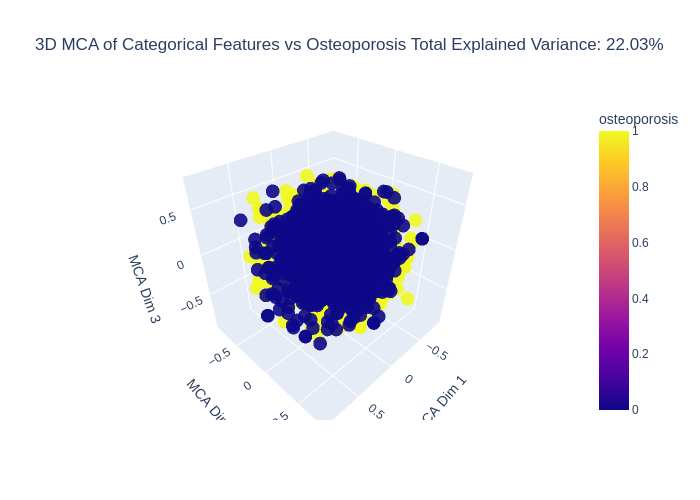

In [344]:
show_plot(fig)

### Overview of the 3D MCA plot

- The plot displays observations projected into three MCA dimensions that together explain **22.03%** of the categorical data inertia.  
- Each point is an observation; the three axes are new synthetic coordinates (dimension 1, 2, 3) that summarize patterns across many categorical variables.  
- Point color encodes the target (osteoporosis) on a continuous scale from low to high, enabling visual assessment of how osteoporosis values distribute across the reduced space.

---

### What the 22.03% explained variance means

- **22.03%** means the three shown dimensions capture about one‑fifth of the total categorical variability.  
- This is enough for exploration and hypothesis generation but **insufficient for full data representation**; most variability remains in higher dimensions.  
- Visual patterns in 3D are meaningful but incomplete; there is no assumuption that separability implied by these axes alone will generalize to predictive models.

---

### Interpreting color, clusters, and gradients

- A **gradient** of color across the cloud suggests osteoporosis correlates with combinations of categories rather than with a single variable.  
- **No sharp clusters** implies overlapping risk profiles; if yellow points (higher osteoporosis) are spread rather than tightly grouped, risk is diffuse.  
- Overlap: As seen, the colors are intermixed, the three MCA axes do not strongly separate the two classes and risk depends on multivariate combinations beyond these dimensions.

---

The 3D MCA is a useful exploratory lens showing that osteoporosis correlates with multivariate categorical patterns, but it captures only a fraction of the information. There will be follow up with supervised validation before adopting these components for decision making.

In [274]:
mca.eigenvalues_summary.head(18)

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.087,7.51%,7.51%
1,0.085,7.33%,14.85%
2,0.083,7.18%,22.03%
3,0.082,7.11%,29.14%
4,0.081,7.00%,36.14%
5,0.080,6.90%,43.04%
6,0.078,6.79%,49.83%
7,0.076,6.60%,56.44%
8,0.075,6.53%,62.97%


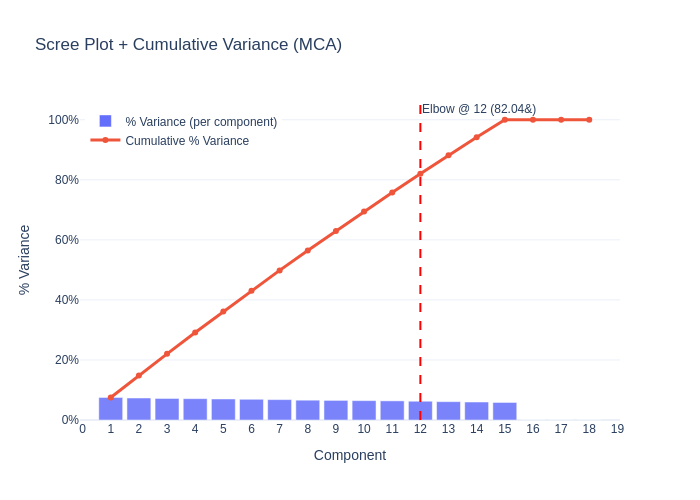

Total explained variance for first 12 components: 82.04%
eigenvalue % of variance % of variance (cumulative)
     0.087         7.51%                      7.51%
     0.085         7.33%                     14.85%
     0.083         7.18%                     22.03%
     0.082         7.11%                     29.14%
     0.081         7.00%                     36.14%
     0.080         6.90%                     43.04%
     0.078         6.79%                     49.83%
     0.076         6.60%                     56.44%
     0.075         6.53%                     62.97%
     0.074         6.45%                     69.42%
     0.074         6.37%                     75.79%
     0.072         6.25%                     82.04%
     0.071         6.11%                     88.15%
     0.069         5.99%                     94.15%
     0.068         5.85%                    100.00%


In [277]:
components = np.arange(1, n + 1)
variance_pct = mca.eigenvalues_summary['% of variance'].str.rstrip('%').astype(float).values
cumulative_variance_pct = mca.eigenvalues_summary['% of variance (cumulative)'].str.rstrip('%').astype(float).values

# Plot scree (bars) + cumulative line on same figure
elbow_idx = 12  # highlight component 12
elbox_value = cumulative_variance_pct[elbow_idx-1]

fig = go.Figure()

# Scree: bar chart of % variance per component
fig.add_trace(go.Bar(
    x=components,
    y=variance_pct,
    name='% Variance (per component)',
    marker=dict(opacity=0.85),
    hovertemplate='Component %{x}<br>% Variance: %{y:.2f}%<extra></extra>'
))

# Cumulative: line
fig.add_trace(go.Scatter(
    x=components,
    y=cumulative_variance_pct,
    mode='lines+markers',
    name='Cumulative % Variance',
    line=dict(width=3),
    marker=dict(size=6),
    hovertemplate='Component %{x}<br>Cumulative: %{y:.2f}%<extra></extra>'
))

# Vertical line to mark elbow (component 9)
if elbow_idx <= components.max():
    fig.add_vline(x=elbow_idx, line_width=2, line_dash="dash", line_color="red",
                  annotation_text=f"Elbow @ {elbow_idx} ({elbox_value}&)", annotation_position="top right")

# Layout
fig.update_layout(
    title="Scree Plot + Cumulative Variance (MCA)",
    xaxis_title="Component",
    yaxis_title="% Variance",
    yaxis=dict(ticksuffix="%"),
    legend=dict(yanchor="top", y=0.98, xanchor="left", x=0.01),
    template="plotly_white",
    width=900,
    height=520,
    bargap=0.15
)

fig.update_xaxes(dtick=1)  # show every component tick
fig.show()

# Print a short summary for notebook output
print(f"Total explained variance for first {elbow_idx} components: {cumulative_variance_pct[elbow_idx-1]:.2f}%")
print(mca.eigenvalues_summary.head(15).to_string(index=False))


### Summary 💡

- **Primary insight:** Categorical features provide a modest but structured signal for osteoporosis; the first three MCA dimensions explain **22.03%** of inertia while the first 12 components capture **~82.04%**, indicating information is spread across many components rather than concentrated in one or two.  
- **Separable signal:** The MCA 3‑D plot uses a binary color mapping (osteoporosis: Yes/No). colors are **intermixed**, so the first three dimensions do **not** strongly separate cases from controls.  
- **Top pairwise associations:** Measured by Cramer’s V, **body_weight (0.03)** and **medications (0.02)** are the largest pairwise associations; all other variables show near‑zero values.  
- **Actionable implication:** Use multicomponent, multivariate representations (retain ~12 MCA components) for modeling; do not rely on pairwise Cramer’s V alone because bivariate effects are very weak.

---

### Screeplot — key findings

- **Elbow at component 12.** Cumulative variance reaches **~82.04%** by component 12, supporting a retention threshold of 12 components for comprehensive representation.  
- **Distributed component importance.** Each of the first 12 components contributes roughly **6–7%** of variance; there is no single dominant axis driving most inertia.  
- **Effective dimensionality cutoff.** Nonzero eigenvalues are concentrated in the first ~14 components, with components 15–17 showing zero contribution, so substantive structure resides in the first ~14 components.

---

### 3‑D MCA plot — key findings

- **Partial capture of structure.** The three plotted components jointly explain **22.03%** of inertia, so the 3‑D view is useful for exploration but omits most variance.  
- **Binary coloring and overlap.** The plot colors are binary (Yes/No). The two classes are **heavily intermixed** across the three axes, indicating poor low‑dimensional separability.  
- **Implication for modeling.** Classifiability will likely improve only when including more MCA components (beyond the first three) or additional continuous predictors and engineered features.

---

### Cramer’s V plot — key findings

- **Highest pairwise signals are minimal.** **body_weight = 0.03** and **medications = 0.02** are the strongest pairwise associations; maximum Cramer’s V ≈ 0.03 indicates very weak bivariate associations.  
- **Most variables near zero.** Gender, family_history, hormonal_changes, race_ethnicity, calcium_intake, vitamin_d_intake, physical_activity, smoking, alcohol_consumption, medical_conditions, and prior_fractures show negligible pairwise association with osteoporosis in this table.  
- **Interpretation risk.** Low Cramer’s V values mean single‑variable importance is unreliable; joint category patterns (captured by MCA) matter more than marginal pairwise effects.

---

### Recommendations

- **Retain multi‑component representation.** Keep at least **12 MCA components** for downstream clustering, visualization, or model‑building to preserve ~82% of inertia.  
- **Run follow‑up analyses.** Which categories drive the retained components and validate the practical importance of body_weight and medications.  
- **Feature engineering.** Validate predictive value by training a supervised model that uses MCA component scores and compare performance to models built from raw categorical encodings and from top Cramer’s V variables only.

### Practical Importance of Body weight and Medications
Cheng et al. (2022) and Kaneko et al. (2024) found that glucocorticoid overuse and low preconception body weight respectively increase risks related to osteoporosis. Therefore, Low body weight and chronic corticosteroid exposure are strong, independent predictors of osteoporosis and fragility fracture risk; embedding these variables as core features in the model and using their outputs to trigger targeted screening, early bone-protective therapy, and weight-optimizing interventions will lower predicted and realized fracture incidence and reduce downstream healthcare costs.

### References
Cheng, C. H., Chen, L. R., & Chen, K. H. (2022). Osteoporosis due to hormone imbalance: an overview of the effects of estrogen deficiency and glucocorticoid overuse on bone turnover. International journal of molecular sciences, 23(3), 1376.

Kaneko, K., Suto, M., Miyagawa, E., Mikami, M., Nakamura, Y., Murashima, A., & Takehara, K. (2024). Preconception underweight impact on postnatal osteoporotic fracture: a retrospective cohort study using Japanese claims data. BMC Pregnancy and Childbirth, 24(1), 315.

In [87]:
def plot_contrib_heatmap(contrib_pct, top_n=40, dims=None, title=None):
    if dims is None:
        dims = contrib_pct.columns.tolist()
    # Select top N categories by max contribution across dims
    max_by_cat = contrib_pct.max(axis=1)
    top_idx = max_by_cat.sort_values(ascending=False).head(top_n).index
    sub = contrib_pct.loc[top_idx, dims]

    # Correctly access levels of the MultiIndex for y_labels
    if isinstance(sub.index, pd.MultiIndex):
        y_labels = [f"{v}:{l}" for v, l in sub.index]
    else:
        y_labels = sub.index.tolist() # Fallback, though unlikely with MCA output

    z = sub.values  # shape (top_n, n_dims)

    fig = go.Figure(data=go.Heatmap(
        z=z,
        x=dims,
        y=y_labels,
        colorscale="YlOrRd",
        colorbar=dict(title="Contribution (%)"),
        hovertemplate="%{y}<br>%{x}: %{z:.2f}%<extra></extra>"
    ))
    fig.update_layout(height=40*len(y_labels)+200, title=title or f"Top {len(y_labels)} categories contributions")
    return fig

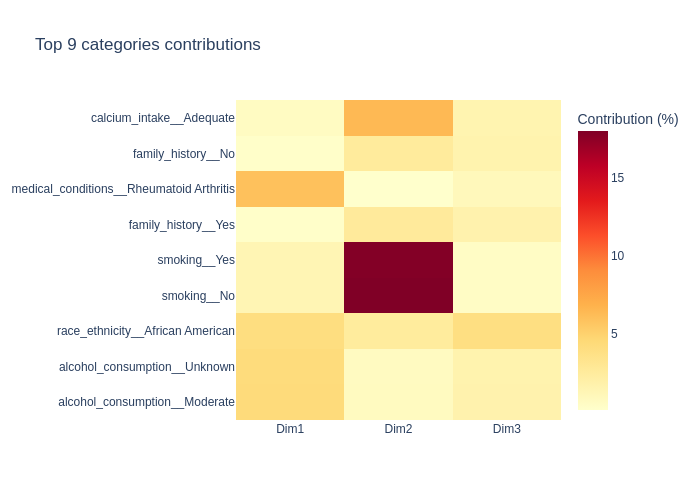

In [71]:
# Top 9 categories, 3 dimensions
top = 9
n=3
fig = plot_contrib_heatmap(contrib_pct, top_n=top, dims=[f"Dim{i+1}" for i in range(n)])
show_plot(fig)

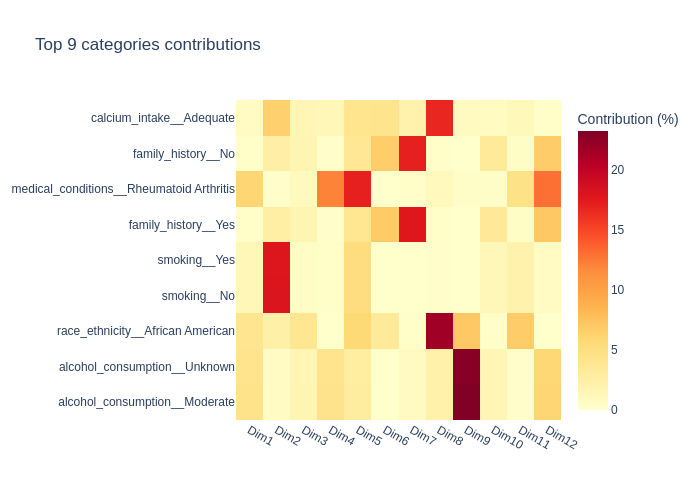

In [78]:
# Top 9 categories, 12 dimensions
top=9
n=12
fig = plot_contrib_heatmap(contrib_pct, top_n=top, dims=[f"Dim{i+1}" for i in range(n)])
show_plot(fig)

In [74]:
contrib_pct.shape

(28, 18)

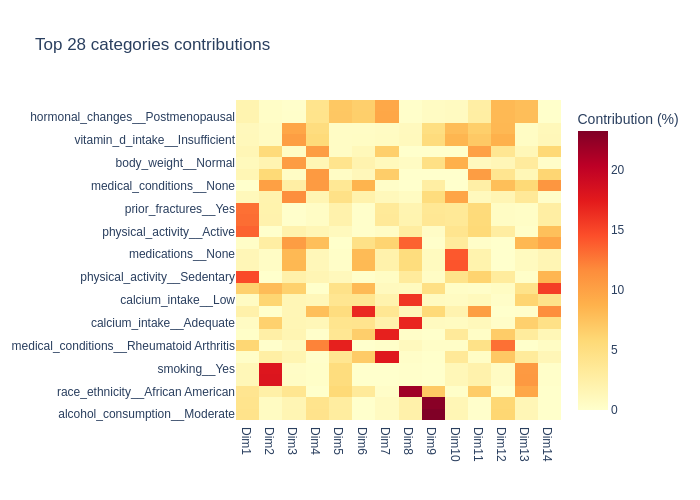

In [84]:
# All categories, 14 dimensions 100%
top = contrib_pct.shape[0]
# n = contrib_pct.shape[1]
n=14
fig = plot_contrib_heatmap(contrib_pct, top_n=top, dims=[f"Dim{i+1}" for i in range(n)])
show_plot(fig)

In [85]:
# contrib_pct: DataFrame indexed by (variable, level), columns = ['Dim1',...]
# for dim in contrib_pct.columns:
#     top = contrib_pct[dim].nlargest(3)
#     print(dim)
#     print(top)


### Key finding

- The MCA heatmap shows a clear, multi-axis structure where distinct domain clusters drive separate dimensions: lifestyle and activity (Dim1, Dim2, Dim9), clinical comorbidity and medication signals (Dim4, Dim5, Dim10, Dim12, Dim14, Dim15), and demographic and body‑composition effects (Dim3, Dim6, Dim8, Dim11). Several single category levels (e.g., smoking, alcohol_consumption_Moderate/Unknown, race_ethnicity_African American, family_history_Yes/No, medications_Corticosteroids) dominate individual components, indicating concentrated drivers rather than evenly distributed contributions.

- The ML pipeline will explicitly surface and preserve at the very least, the above set of high‑impact categorical drivers throughout feature engineering and modeling.

## 2.6 Hypothesis Testing

In [135]:
alpha = 0.001

### 2.6.1 Age association to the risk of developing osteoporosis.

`Null Hypothesis(Ho):` Older patients (age 60 and above) are less likely to develop osteoporosis compared to younger patients (below 60 years)

`Alternate Hypothesis(Ha):` Older patients (age 60 and above) are more likely to develop osteoporosis compared to younger patients (below 60 years)

In [147]:
df_age_osteo = df_osteo.copy()
df_age_osteo['age_group'] = df_osteo['age'].apply(lambda x: '60 and above' if x >= 60 else 'below 60')

contingency_table = pd.crosstab(df_age_osteo['age_group'], df_osteo[target_col])

print("Contingency table (age vs osteoporosis):")
print(contingency_table)

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square statistic: {chi2}")
print(f"p-value: {p}")

Contingency table (age vs osteoporosis):
osteoporosis    0    1
age_group             
60 and above    0  415
below 60      979  564
Chi-square statistic: 524.0821244797727
p-value: 5.475556505458996e-116


In [138]:
if p < alpha:
       print("We reject the Null Hypothesis: There is a significant association between age group and risk of Osteoporosis.")
else:
     print("There is no significant association between age group and risk of Osteoporosis.")

We reject the Null Hypothesis: There is a significant association between age group and risk of Osteoporosis.


### Key findings 💡

| Age group | Non‑osteoporosis (0) | Osteoporosis (1) |
|---|---:|---:|
| **60 and above** | **0** | **415** |
| **below 60** | **979** | **564** |

- **Chi-square statistic:** **524.08**  
- **P-value:** **5.48e-116**

---

### Core insight

- There is an extremely strong, highly significant association between age group and osteoporosis: patients aged **60 and above** show a markedly higher observed prevalence of osteoporosis compared with patients **below 60**.

---

### Quantitative interpretation

1. The chi-square result (524.08, p << 0.001) indicates the observed distribution is far from what would be expected under no association; the null hypothesis of no association is rejected decisively.  
2. The data show **100%** of the 60+ subgroup in this sample are recorded as osteoporosis cases (415/415) while the below‑60 group has a substantially lower case proportion (564/(564+979) ≈ **36.6%**).  
3. This suggests a very large unadjusted absolute risk difference and a very large unadjusted odds ratio favoring higher risk in the 60+ group.

---

### Clinical implications

- Prioritize bone‑density screening and fracture‑prevention interventions for patients aged **60 and above** as a high‑yield case‑finding strategy.  
- Deploy targeted secondary prevention (medication review, vitamin D/calcium optimization, fall‑risk assessment) for the 60+ cohort.  
- Incorporate age ≥60 as a primary trigger in clinical pathways and electronic health record alerts or clinical decision support tool for osteoporosis assessment.

---

### Data quality note and next steps

- The `60 and above` row containing **0 non‑cases** suggests possible sampling bias, selective case ascertainment, or coding error but I am making the decision to use the age_group for feature creation in modelling.  

### 2.6.2 Gender association to the risk of developing osteoporosis.

`Null Hypothesis (Ho):` There is no association between gender and osteoporosis; the probability of having osteoporosis is the same for males and females.

`Alternate Hypothesis (Ha):` There is an association between gender and osteoporosis; the probability of having osteoporosis differs between males and females.

In [152]:
contingency_table = pd.crosstab(df_osteo['gender'], df_osteo[target_col])

print("Contingency table (gender vs osteoporosis):")
print(contingency_table)

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-square statistic: {chi2}")
print(f"p-value: {p}")

Contingency table (gender vs osteoporosis):
osteoporosis    0    1
gender                
Female        489  477
Male          490  502
Chi-square statistic: 0.24723460562345556
p-value: 0.619029042975477


In [150]:
if p < alpha:
       print("We reject the Null Hypothesis: There is a significant association between gender and risk of Osteoporosis.")
else:
     print("There is no significant association between gender and risk of Osteoporosis.")

There is no significant association between gender and risk of Osteoporosis.


### Key findings 💡

| Gender | Non‑osteoporosis (0) | Osteoporosis (1) |
|---|---:|---:|
| **Female** | **489** | **477** |
| **Male** | **490** | **502** |

- **Chi-square statistic:** **0.2472**  
- **P-value:** **0.6190**

---

### Core insight

- There is no statistically significant association between gender and osteoporosis in this sample; the distribution of cases is similar for females and males.

---

### Quantitative interpretation

- The chi-square result (0.247, p = 0.619) is far above conventional significance thresholds, indicating observed counts do not differ meaningfully from expected counts under the null hypothesis.  
- Case proportions are approximately balanced: females ~49.4% cases, males ~50.6% cases, showing negligible absolute difference.

---

### Clinical implications

- Gender alone, as measured here, should not drive differential screening policies or immediate resource allocation for osteoporosis without further evidence.  
- Focus screening and intervention strategies on established high‑risk features (age, prior fractures, medication use, clinical risk factors) rather than gender alone.

---

### Recommendations and next steps

- Test subgroup- postmenopausal females, test those prespecified subgroups with appropriate multiplicity control if hypotheses remain becomes clinically relevant.

In [155]:
df_osteo.gender.unique()

['Female', 'Male']
Categories (2, object): ['Female', 'Male']

In [164]:
cols = ['gender', 'hormonal_changes', 'osteoporosis']
df_meno_f_osteo = df_osteo.query("hormonal_changes == 'Postmenopausal' and gender == 'Female'")[cols].copy()
contingency_table = pd.crosstab(df_meno_f_osteo['gender'], df_meno_f_osteo[target_col])

print("Contingency table (Postmenopausal women vs osteoporosis):")
print(contingency_table)

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-square statistic: {chi2}")
print(f"p-value: {p}")

Contingency table (Postmenopausal women vs osteoporosis):
osteoporosis    0    1
gender                
Female        251  240
Chi-square statistic: 0.0
p-value: 1.0


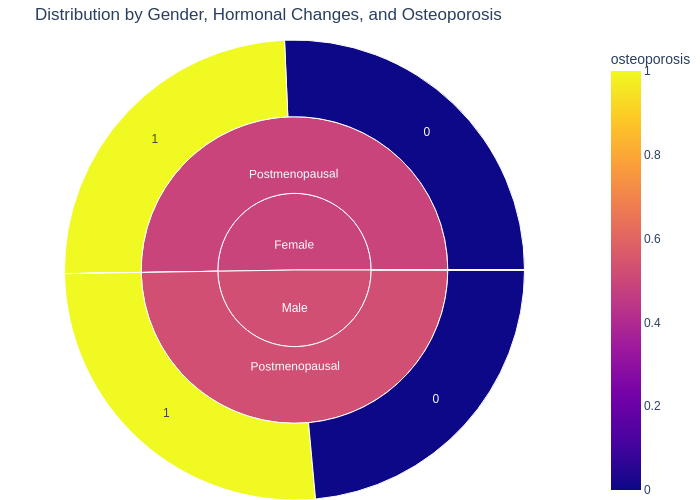

In [182]:
df_meno_osteo = df_osteo.query("hormonal_changes == 'Postmenopausal'")[cols].copy()

counts = (
    df_meno_osteo.groupby(["gender", "hormonal_changes", "osteoporosis",])
      .size()
      .reset_index(name="count")
)

fig = px.sunburst(
    counts,
    path=["gender", "hormonal_changes", "osteoporosis"],
    values="count",
    color="osteoporosis",
    color_discrete_map=COLOR_DISCRETE_SEQUENCE,
    title="Distribution by Gender, Hormonal Changes, and Osteoporosis",
)
fig.update_layout(margin=dict(t=40, l=0, r=0, b=0))
fig.show()


### Key findings

| Subgroup | Non‑osteoporosis (0) | Osteoporosis (1) |
|---|---:|---:|
| **Postmenopausal women** | **251** | **240** |

- **Chi‑square statistic:** **0.0**  
- **P‑value:** **1.0**

---

### Core insight

- The sunburst visualization for **postmenopausal females** agrees with the specific 2×2 contrast tested (postmenopausal women vs comparison group used) produces balanced counts (251 vs 240) and no statistical difference (χ² = 0.0, p = 1.0).  

---

### Recommended next steps (actionable)

1. Compare model performance with and without gender using hold‑out data or cross‑validation: **AUC**.  
2. If gender fails to improve discrimination, or feature importance then drop it prior to final model training since no clinical rationale exists to approve the `males` undergo `menopause`.  

## 3.0 Data Preparation 🛠️

#### 3.1 Check for balanced dataset


In [183]:
class_counts = df_osteo[target_col].value_counts().reset_index()
class_counts.columns = [target_col + '_class', 'count']
class_counts

,osteoporosis_class,count
0,1,979
1,0,979


In [184]:
class_ratio =  class_counts.copy()
class_ratio['ratio'] = class_ratio['count'].apply(lambda x: x*100/class_counts['count'].sum())
class_ratio.drop(columns='count', inplace=True)
class_ratio

,osteoporosis_class,ratio
0,1,50.00
1,0,50.00


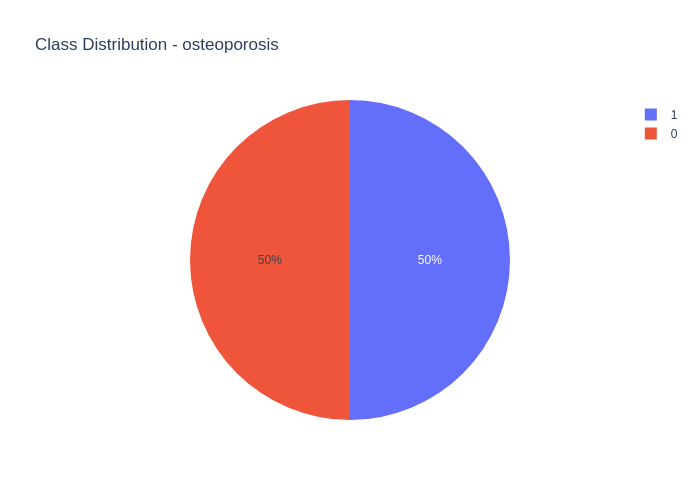

In [186]:
# Visualizing the class distribution of the target variable
fig = px.pie(
    class_ratio,
    values='ratio',
    names=target_col+'_class',
    title=f'Class Distribution - {target_col}',
)

show_plot(fig)

### Key Findings 💡

Osteoporosis outcome is perfectly balanced: **50.0% non‑cases (0) / 50.0% cases (1)**.

---

### Strategic implication

This balance removes the immediate need for class‑imbalance corrections such as SMOTE, allowing focus on model selection, calibration, and clinically driven thresholding rather than resampling or aggressive reweighting.

---

### Tactical recommendations

- **Data split:** Use stratified train/validation/test splits to preserve the 50/50 distribution.  
- **Modeling approach:** Train standard classifiers (logistic regression, tree‑based models) without mandatory oversampling.  
- **Evaluation:** Prioritize discrimination (AUC) and **calibration** (Brier score, calibration plots); report sensitivity, specificity, PPV, and NPV at clinically relevant thresholds.  
- **Threshold selection:** Choose operating points based on clinical trade‑offs (for screening favor higher sensitivity) rather than global accuracy.  
- **Monitoring:** Track class balance across cohorts and time; trigger retraining or recalibration if drift is detected.

---

### Decision summary

Proceed to model development without class‑imbalance fixes, while documenting sensitivity analyses and enforcing stratified sampling and calibration‑focused evaluation.

### 3.2 Split Data into X and y then into train and eval for training and evaluation


In [189]:
print(f"There are {df_osteo.isna().all().sum()} missing values in the dataset.")

There are 0 missing values in the dataset.


In [190]:
df_osteo.columns

Index(['id', 'age', 'gender', 'hormonal_changes', 'family_history',
       'race_ethnicity', 'body_weight', 'calcium_intake', 'vitamin_d_intake',
       'physical_activity', 'smoking', 'alcohol_consumption',
       'medical_conditions', 'medications', 'prior_fractures', 'osteoporosis'],
      dtype='object')

In [191]:
# Split the data into X and y
X = df_osteo.drop(columns=['id', target_col])
y = df_osteo[[target_col]]

In [192]:
features = X.columns.to_list()

In [194]:
numerical_features = X.select_dtypes(include=['number']).columns.to_list()
numerical_features

['age']

In [193]:
categorical_features = X.select_dtypes(include=['category']).columns.to_list()
categorical_features

['gender',
 'hormonal_changes',
 'family_history',
 'race_ethnicity',
 'body_weight',
 'calcium_intake',
 'vitamin_d_intake',
 'physical_activity',
 'smoking',
 'alcohol_consumption',
 'medical_conditions',
 'medications',
 'prior_fractures']

In [195]:
# Split the X and y into train and eval
X_train, X_eval, y_train, y_eval =  train_test_split(X, y, train_size=0.8, random_state=RANDOM_STATE, stratify=y)
(X_train.shape, y_train.shape), (X_eval.shape, y_eval.shape)

(((1566, 14), (1566, 1)), ((392, 14), (392, 1)))

In [196]:
# Ensure the dimensions match
assert X_train.shape[1] == X_eval.shape[1], "Number of features doesn't match"

In [197]:
data_split_size = pd.DataFrame({
    'data': ['train', 'evaluation'],
    'size': [y_train.shape[0], y_eval.shape[0]]
})
data_split_size

,data,size
0,train,1566
1,evaluation,392


#### 3.3 Creating preprocessing pipeline- feature creation, imputation, encoding, scaling, and transformation


#### 3.3.1 Feature Engineering

In [269]:
# utils_feature_creation.py
import pandas as pd
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import PolynomialFeatures
from typing import List, Dict, Optional

# Default missing handling map (column → category to fill)
DEFAULT_COL_MAP: Dict[str, str] = {
    'alcohol_consumption': 'Unknown', # Missing may be unreported or non-drinker
    'medical_conditions': 'None',     # Missing = no known condition
    'medications': 'None'             # Missing = not on relevant medications (e.g., corticosteroids)
}


class FeatureCreation(BaseEstimator, TransformerMixin):
    """
    scikit-learn transformer that:
      - fills missing categorical values using col_category_map (direct category values)
      - adds polynomial age terms (age_squared, optional age_cubed)
      - adds categorical age_group ('below_60' / '60_and_above')
      - adds explicit age × categorical-level numeric interaction columns (e.g. age_x_smoking_Yes)
    """
    def __init__(
        self,
        categorical_cols: List[str],
        degree: int = 2,
        col_category_map: Optional[Dict[str, str]] = None
    ):
        # Ensure parameters are set as attributes with the same name
        self.categorical_cols = categorical_cols
        self.degree = degree
        if self.degree < 1 or self.degree > 3:
            raise ValueError("degree must be 1, 2, or 3")
        self.poly = PolynomialFeatures(degree=self.degree, include_bias=False)
        self.levels_: Dict[str, List[str]] = {}
        self._interaction_feature_names: List[str] = []
        self.col_category_map = col_category_map if col_category_map is not None else DEFAULT_COL_MAP

    # -------------------------
    # Missing handling
    # -------------------------
    def _handle_missing(self, df: pd.DataFrame) -> pd.DataFrame:
        """
        Fills missing values in categorical clinical columns safely.

        Each column can have missing values handled in one of two ways:
        - 'None'    : missing values indicate true absence (e.g., no condition or no medication).
        - 'Unknown' : missing values indicate unreported/ambiguous information.

        The function adds the appropriate category ('None' or 'Unknown') to the column
        before filling missing values to ensure compatibility with pandas Categorical dtype.

        Parameters
        ----------
        df : pd.DataFrame
            The input DataFrame containing clinical categorical columns.


        Returns
        -------
        pd.DataFrame
            DataFrame with missing values filled according to specified clinical logic.
        """
        df = df.copy()
        for col, fill_value in self.col_category_map.items():
            if col in df.columns:
                # If categorical, ensure the fill value is in the categories
                if pd.api.types.is_categorical_dtype(df[col]):
                    if fill_value not in df[col].cat.categories:
                        df[col] = df[col].cat.add_categories(fill_value)
                df[col] = df[col].fillna(fill_value)
        return df

    # -------------------------
    # Fit / Transform helpers
    # -------------------------
    def fit(self, X: pd.DataFrame, y=None):
        if not isinstance(X, pd.DataFrame):
            raise ValueError("X must be a pandas DataFrame")

        # Apply missing handling on training data so sentinel levels are recorded
        X_filled = self._handle_missing(X)

        # Learn unique levels for each categorical column
        self.levels_ = {} # Initialize levels_ in fit
        for c in self.categorical_cols:
            if c in X_filled.columns:
                # Ensure levels are strings for consistent handling
                s = X_filled[c].astype(str)
                # Get unique levels and sort them
                levels = sorted(s.unique().tolist())
                self.levels_[c] = levels
            else:
                # Handle case where column is not in X_filled
                self.levels_[c] = []


        # Fit polynomial features transformer on age
        if 'age' in X_filled.columns:
            age_arr = pd.to_numeric(X_filled['age'], errors='coerce').to_numpy().reshape(-1, 1)
            # Only fit if there's data
            if age_arr.size > 0:
                self.poly.fit(age_arr)

        # Reset interaction feature names in fit
        self._interaction_feature_names = []


        return self

    def _poly_transform_age(self, age_series: pd.Series) -> pd.DataFrame:
        age_arr = pd.to_numeric(age_series, errors='coerce').to_numpy().reshape(-1, 1)
        # Transform only if the transformer was fitted (i.e., if 'age' existed and had data in fit)
        if hasattr(self, 'poly') and hasattr(self.poly, 'n_features_in_'):
             poly_arr = self.poly.transform(age_arr)
             df_poly = pd.DataFrame(index=age_series.index)
             # Ensure the number of columns in poly_arr is as expected after transformation
             if poly_arr.shape[1] >= 2:
                 df_poly['age_squared'] = poly_arr[:, 1]
             if poly_arr.shape[1] >= 3:
                 df_poly['age_cubed'] = poly_arr[:, 2]
             return df_poly
        else:
            # Return an empty DataFrame if polynomial features were not fitted
            df_poly = pd.DataFrame(index=age_series.index)
            if self.degree >= 2:
                 df_poly['age_squared'] = np.nan # Or some other indicator
            if self.degree >= 3:
                 df_poly['age_cubed'] = np.nan # Or some other indicator
            return df_poly


    def _make_age_group(self, age_series: pd.Series) -> pd.Series:
        grp = np.where(age_series >= 60, '60_and_above', 'below_60')
        # Use categories from training if available, otherwise infer
        if 'age_group' in self.levels_:
             return pd.Series(grp, index=age_series.index).astype(pd.CategoricalDtype(categories=self.levels_['age_group']))
        else:
             return pd.Series(grp, index=age_series.index).astype("category")



    def _create_interactions(self, df: pd.DataFrame) -> pd.DataFrame:
        if 'age' not in df.columns:
            raise ValueError("'age' column required for interactions")

        age_vals = pd.to_numeric(df['age'], errors='coerce')
        interactions = pd.DataFrame(index=df.index)
        feature_names = []

        for c in self.categorical_cols:
            levels = self.levels_.get(c, [])
            if not levels:
                continue

            series = df[c].astype(str)
            # Use categories learned in fit
            dummies = pd.get_dummies(pd.Categorical(series, categories=levels), prefix=c)

            # ensure all expected dummy columns exist
            for lvl in levels:
                colname = f"{c}_{lvl}"
                if colname not in dummies.columns:
                    dummies[colname] = 0

            # Ensure column order is consistent
            dummy_cols_sorted = sorted(dummies.columns)
            dummies = dummies[dummy_cols_sorted]


            for dummy_col in dummies.columns:
                feat_name = f"age_x_{dummy_col}"
                interactions[feat_name] = age_vals * dummies[dummy_col]
                feature_names.append(feat_name)

        # Store interaction feature names after creation in transform
        self._interaction_feature_names = feature_names
        return interactions

    def transform(self, X: pd.DataFrame) -> pd.DataFrame:
        if not isinstance(X, pd.DataFrame):
            raise ValueError("X must be a pandas DataFrame")
        df = X.copy()

        if 'age' not in df.columns:
            raise ValueError("Input DataFrame must contain 'age' column")

        # 1) handle missing categorical values
        df = self._handle_missing(df)

        # 2) polynomial features
        poly_df = self._poly_transform_age(df['age'])
        for col in poly_df.columns:
            # Only add if the polynomial feature was generated (not NaN)
            if col in poly_df.columns and not poly_df[col].isnull().all():
                 df[col] = poly_df[col]


        # 3) add age group
        if 'age_group' not in df.columns:
            df['age_group'] = self._make_age_group(df['age'])

        # 4) age × categorical interactions
        inter_df = self._create_interactions(df)
        # Drop existing interaction columns before adding new ones
        existing_interaction_cols = [col for col in df.columns if col.startswith('age_x_')]
        if existing_interaction_cols:
             df.drop(columns=existing_interaction_cols, inplace=True)

        for col in inter_df.columns:
            df[col] = inter_df[col]

        return df

    # -------------------------
    # Helpers
    # -------------------------
    def get_interaction_feature_names(self) -> List[str]:
        return list(self._interaction_feature_names)

    def get_feature_names_out(self, input_features: Optional[List[str]] = None) -> List[str]:
        # Combine original features (excluding 'age' as it's transformed),
        # generated polynomial features, 'age_group', and interaction features
        generated_features = []
        if self.degree >= 2:
            generated_features.append('age_squared')
        if self.degree >= 3:
            generated_features.append('age_cubed')
        generated_features.append('age_group')
        generated_features.extend(self._interaction_feature_names)

        # Assuming original categorical_cols are passed through after missing imputation but before one-hot encoding
        # and 'age' is replaced by its polynomial terms.
        # The actual output features will depend on the downstream ColumnTransformer's selectors and transformers.
        # This method should return names generated by *this* transformer.
        return generated_features

In [270]:
# -------------------------
# 1) Feature creation pipeline (applies feature engineering to the whole DF)
# -------------------------
feature_creation_pipeline = Pipeline([
    ('feature_creator', FeatureCreation(categorical_cols=categorical_cols, degree=2))
])

# -------------------------
# 2) Numerical pipeline
#    - We want to scale ALL numeric columns after augmentation:
#      this includes: 'age', 'age_squared', and generated 'age_x_*' numeric features.
#    - Use ColumnTransformer with a dtype-based selector so we do not need to enumerate generated names.
# -------------------------
numerical_pipeline = Pipeline([
    # 'scaler' will be applied by downstream ColumnTransformer via a numeric selector.
    # We keep it as a simple Pipeline component to show intent; actual scaling attached in ColumnTransformer below.
    ('scaler', RobustScaler())
])

# -------------------------
# 3) Categorical pipeline
#    - OneHotEncode original categorical cols + 'age_group' created by FeatureCreation
# -------------------------
categorical_pipeline = Pipeline([
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
])

# -------------------------
# Combine pipelines into ColumnTransformer
#  - Use make_column_selector to select numeric columns by dtype for scaling
#  - Provide explicit list for categorical columns (include 'age_group')
#  - remainder='passthrough' allows any generated numeric interaction columns to pass through if not selected,
#    but since we scale all numeric with make_column_selector, interactions (numeric dtype) will be scaled.
# -------------------------
from sklearn.compose import make_column_selector as selector

def create_preprocessor(
    categorical_cols: List[str],
    feature_creation_pipeline: Optional[Pipeline] = None,
    include_feature_creation: bool = True
) -> ColumnTransformer:
    """
    Creates a ColumnTransformer preprocessor with numeric and categorical transformers.

    Args:
        categorical_cols: List of base categorical columns.
        feature_creation_pipeline: Optional fitted feature creation pipeline.
        include_feature_creation: Whether to include feature creation columns in categorical transformer.

    Returns:
        ColumnTransformer: A preprocessor ready for fitting/transformation.
    """
    # Determine final categorical columns
    if include_feature_creation and feature_creation_pipeline is not None:
        cat_cols_final = categorical_cols + feature_creation_pipeline.get_feature_names_out()
    else:
        cat_cols_final = categorical_cols

    # Define the preprocessor
    preprocessor = ColumnTransformer(
        transformers=[
            # numeric transformer: selects all numeric dtype columns (including generated interactions)
            ('num', RobustScaler(), selector(dtype_include=np.number)),
            # categorical transformer: explicitly list categorical columns
            ('cat', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False), cat_cols_final)
        ],
        remainder='drop' # drop anything else
    )

    return preprocessor




preprocessor = create_preprocessor(
    categorical_cols=categorical_cols,
    feature_creation_pipeline=feature_creation_pipeline,
    include_feature_creation=True
)


preprocessor

ColumnTransformer(transformers=[('num', RobustScaler(),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x7c48d8b1caa0>),
                                ('cat',
                                 OneHotEncoder(drop='first',
                                               handle_unknown='ignore',
                                               sparse_output=False),
                                 ['gender', 'hormonal_changes',
                                  'family_history', 'race_ethnicity',
                                  'body_weight', 'calcium_intake',
                                  'vitamin_d_intake', 'physical_activity',
                                  'smoking', 'alcohol_consumption',
                                  'medical_conditions', 'medications',
                                  'prior_fractures', 'age_squared',
                                  'age_group'])])

In [271]:
# -------------------------
# Full pipeline: feature creation -> preprocessing -> classifier
# -------------------------
model_pipeline = Pipeline([
    ('feature_creation', feature_creation_pipeline),   # creates age_squared, age_group, age_x_* features
    ('preprocessing', preprocessor),                   # scales numeric, encodes categorical
    ('clf', RandomForestClassifier(n_estimators=200, random_state=RANDOM_STATE))
])

model_pipeline

# -------------------------
# Example usage:
# -------------------------
# X_train, y_train must be pandas DataFrame / Series
# model_pipeline.fit(X_train, y_train)
# predictions = model_pipeline.predict(X_test)
#
# After fitting the feature_creation step you can inspect generated interactions:
# feat_creator = model_pipeline.named_steps['feature_creation'].named_steps['feature_creator']
# print(feat_creator.get_interaction_feature_names())

Pipeline(steps=[('feature_creation',
                 Pipeline(steps=[('feature_creator',
                                  FeatureCreation(categorical_cols=['gender',
                                                                    'hormonal_changes',
                                                                    'family_history',
                                                                    'race_ethnicity',
                                                                    'body_weight',
                                                                    'calcium_intake',
                                                                    'vitamin_d_intake',
                                                                    'physical_activity',
                                                                    'smoking',
                                                                    'alcohol_consumption',
                                                                    'medical_conditions',
                                                                    'medications',
                                                                    'prior_fractures'],
                                                  col_category_map={'alcohol_...
                                                                handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['gender', 'hormonal_changes',
                                                   'family_history',
                                                   'race_ethnicity',
                                                   'body_weight',
                                                   'calcium_intake',
                                                   'vitamin_d_intake',
                                                   'physical_activity',
                                                   'smoking',
                                                   'alcohol_consumption',
                                                   'medical_conditions',
                                                   'medications',
                                                   'prior_fractures',
                                                   'age_squared',
                                                   'age_group'])])),
                ('clf',
                 RandomForestClassifier(n_estimators=200, random_state=2025))])

## 4.0 Modelling & Evaluation 💡

**Models**

1. AdaBoostClassifier
2. CatBoostClassifier
3. DecisionTreeClassifier
4. KNeighborsClassifier
5. LogisticRegression
6. RandomForestClassifier
7. Support Vector Machines
8. XGBClassifier
9. Lightgbm

- Create a models list

In [ ]:
METRIC = "f1_score"

In [272]:
N_JOBS = -1
VERBOSE = 0
METRIC = "f1_score"

# Define the list of models to evaluate
models = [
    AdaBoostClassifier(random_state=RANDOM_STATE),
    CatBoostClassifier(random_state=RANDOM_STATE, verbose=VERBOSE),
    DecisionTreeClassifier(random_state=RANDOM_STATE),
    KNeighborsClassifier(n_neighbors=10),
    LogisticRegression(random_state=RANDOM_STATE, verbose=VERBOSE),
    RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS, verbose=VERBOSE),
    svm.SVC(random_state=RANDOM_STATE, probability=True),
    XGBClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS, verbose=VERBOSE),
    lgb.LGBMClassifier(random_state=RANDOM_STATE, verbose=-1)
]

In [273]:
def evaluate_models(
    models: List[ClassifierMixin],
    feature_creation_pipeline: Pipeline,
    preprocessor: Pipeline,
    X_train: pd.DataFrame,
    y_train_encoded: np.ndarray,
    X_eval: pd.DataFrame,
    y_eval_encoded: np.ndarray,
    target_class: Optional[List[str]] = None,
    apply_resampling: bool = False,
    create_features: bool = False,
    random_state: int = 2025
) -> Tuple[pd.DataFrame, Dict[str, Pipeline]]:
    """
    Evaluate a list of sklearn estimators using the provided pipelines.

    Parameters
    ----------
    models : List[ClassifierMixin]
        Estimator instances (unfitted).
    feature_creation_pipeline : Pipeline
        Pipeline that augments raw DataFrame with age_squared, age_group, interactions, etc.
    preprocessor : Pipeline
        Preprocessor that scales numeric and encodes categorical features (expects augmented DF).
    X_train : pd.DataFrame
        Training features (raw, without augmentation).
    y_train_encoded : np.ndarray
        Encoded training targets.
    X_eval : pd.DataFrame
        Evaluation features.
    y_eval_encoded : np.ndarray
        Encoded evaluation targets.
    target_class : Optional[List[str]]
        List of class names (for classification_report and confusion matrix labels). If None, inferred.
    apply_resampling : bool
        If True, include SMOTE in the training pipeline.
    create_features: bool
        If True, include feature creation pipeline in the training pipeline.
    random_state : int
        Random seed for SMOTE / classifiers where applicable.

    Returns
    -------
    metrics_table : pd.DataFrame
        Table with accuracy, precision, recall, f1_score for each model.
    trained_models : Dict[str, Pipeline]
        Dictionary mapping model names to trained pipelines.
    """
    if target_class is None:
        target_class = np.unique(y_eval_encoded).tolist()

    trained_models: Dict[str, Pipeline] = {}
    metrics_table: pd.DataFrame = pd.DataFrame(
        columns=['model_name', 'accuracy', 'precision', 'recall', 'f1_score']
    )

    for model in models:
        text = 'balanced' if apply_resampling else 'no resampling'
        final_pipeline: Pipeline = (
            # Choose imbalanced-learn Pipeline if resampling is applied, otherwise use standard sklearn Pipeline
            imPipeline if apply_resampling else Pipeline
            )(
            steps=[
                *([('feature_creator', feature_creation_pipeline)] if create_features else []),  # Optional feature creation
                ('preprocessor', preprocessor),
                *([('smote_sampler', SMOTE(random_state=random_state))] if apply_resampling else []),  # Optional SMOTE
                ('feature_selector', SelectKBest(mutual_info_classif, k='all')),                 # Feature selection
                ('classifier', model)                                                            # Final classifier
            ]
        )

        # Fit final pipeline
        final_pipeline.fit(X_train, y_train_encoded)

        # Predict
        y_pred: np.ndarray = final_pipeline.predict(X_eval)

        # Metrics
        metrics = classification_report(
            y_eval_encoded, y_pred, target_names=target_class, output_dict=True
        )
        metrics_print = classification_report(
            y_eval_encoded, y_pred, target_names=target_class
        )

        model_name: str = final_pipeline.named_steps['classifier'].__class__.__name__
        print(f"This is the classification report of the {text} {model_name} model\n{metrics_print}\n")

        # Extract weighted average metrics
        accuracy: float = metrics.get('accuracy', np.nan)
        precision: float = metrics.get('weighted avg', {}).get('precision', np.nan)
        recall: float = metrics.get('weighted avg', {}).get('recall', np.nan)
        f1score: float = metrics.get('weighted avg', {}).get('f1-score', np.nan)

        metrics_table.loc[len(metrics_table)] = [model_name, accuracy, precision, recall, f1score]

        # Confusion matrix
        model_conf_mat: pd.DataFrame = pd.DataFrame(
            confusion_matrix(y_eval_encoded, y_pred),
            index=target_class,
            columns=target_class
        )
        print(f"Below is the confusion matrix for the {text} {model_name} model")

        fig = px.imshow(
            model_conf_mat.values,
            labels=dict(x='Predicted', y='Actual', color='Count'),
            x=target_class,
            y=target_class,
            text_auto=True
        )
        fig.update_layout(
            title=f'Confusion Matrix — {text} {model_name}',
            xaxis_nticks=len(target_class),
            yaxis_nticks=len(target_class)
        )
        try:
            show_plot(fig)
        except NameError:
            fig.show()

        trained_model_name: str = f"trained_{text.strip()}_{model_name.lower()}"
        trained_models[trained_model_name] = final_pipeline

        print('\n', '-----   -----'*6, '\n')

    # Summary table
    metrics_table.set_index('model_name', inplace=True)
    metrics_table.sort_values(by=['f1_score', 'precision', 'recall', 'accuracy'], ascending=False, inplace=True)
    print(f"\nModel evaluation summary report: {text} dataset")

    return metrics_table, trained_models


In [274]:
# Encode the target variable for compatibility with some models and metrics
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train.values.ravel())
y_eval_encoded = label_encoder.transform(y_eval.values.ravel())

# Get the target class names for the classification report
target_class_names = [str(n) for n in label_encoder.classes_.tolist()]

This is the classification report of the no resampling AdaBoostClassifier model
              precision    recall  f1-score   support

           0       0.81      0.97      0.88       196
           1       0.97      0.77      0.86       196

    accuracy                           0.87       392
   macro avg       0.89      0.87      0.87       392
weighted avg       0.89      0.87      0.87       392


Below is the confusion matrix for the no resampling AdaBoostClassifier model


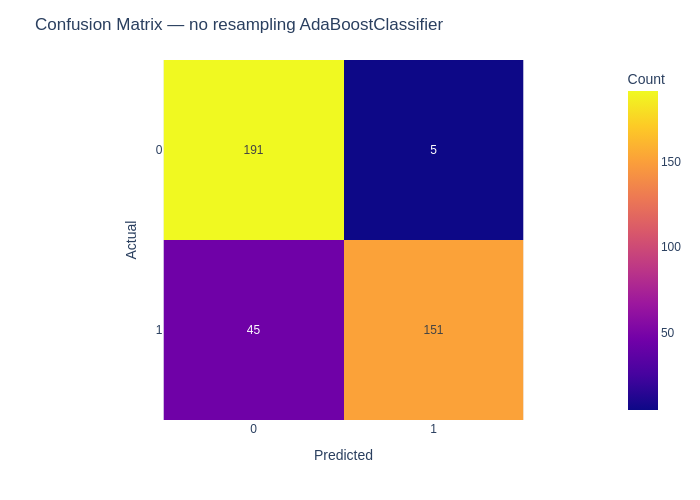


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling CatBoostClassifier model
              precision    recall  f1-score   support

           0       0.85      0.99      0.92       196
           1       0.99      0.83      0.90       196

    accuracy                           0.91       392
   macro avg       0.92      0.91      0.91       392
weighted avg       0.92      0.91      0.91       392


Below is the confusion matrix for the no resampling CatBoostClassifier model


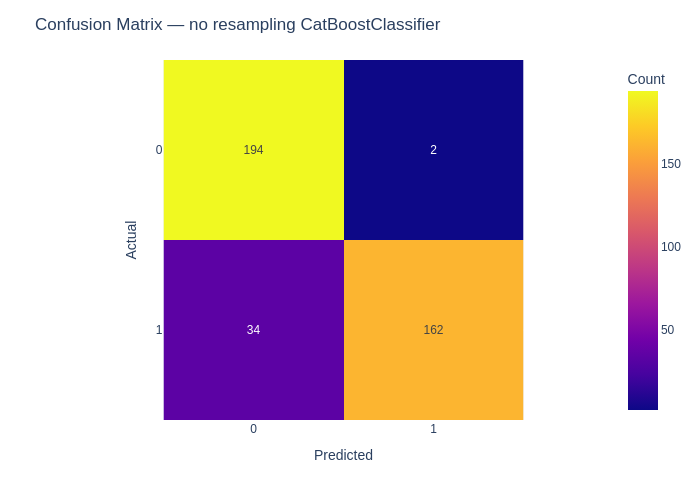


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling DecisionTreeClassifier model
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       196
           1       0.81      0.84      0.82       196

    accuracy                           0.82       392
   macro avg       0.82      0.82      0.82       392
weighted avg       0.82      0.82      0.82       392


Below is the confusion matrix for the no resampling DecisionTreeClassifier model


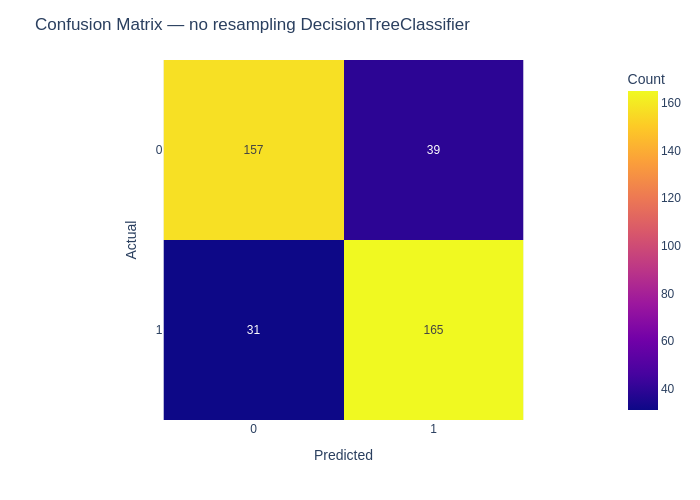


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling KNeighborsClassifier model
              precision    recall  f1-score   support

           0       0.75      0.92      0.83       196
           1       0.90      0.70      0.79       196

    accuracy                           0.81       392
   macro avg       0.83      0.81      0.81       392
weighted avg       0.83      0.81      0.81       392


Below is the confusion matrix for the no resampling KNeighborsClassifier model


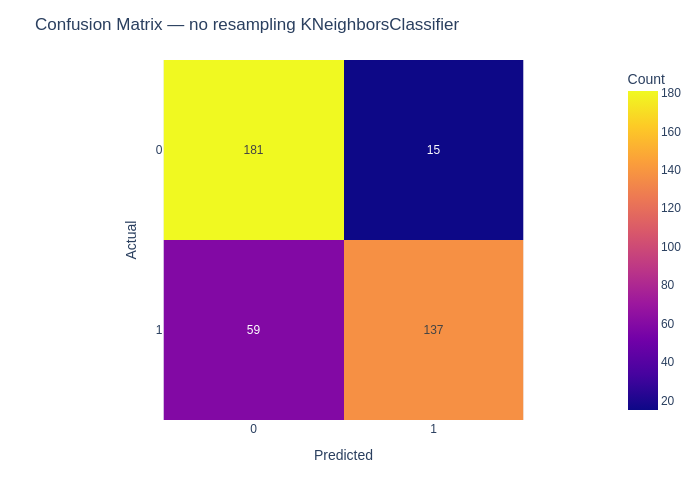


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling LogisticRegression model
              precision    recall  f1-score   support

           0       0.82      0.90      0.86       196
           1       0.89      0.81      0.85       196

    accuracy                           0.85       392
   macro avg       0.86      0.85      0.85       392
weighted avg       0.86      0.85      0.85       392


Below is the confusion matrix for the no resampling LogisticRegression model


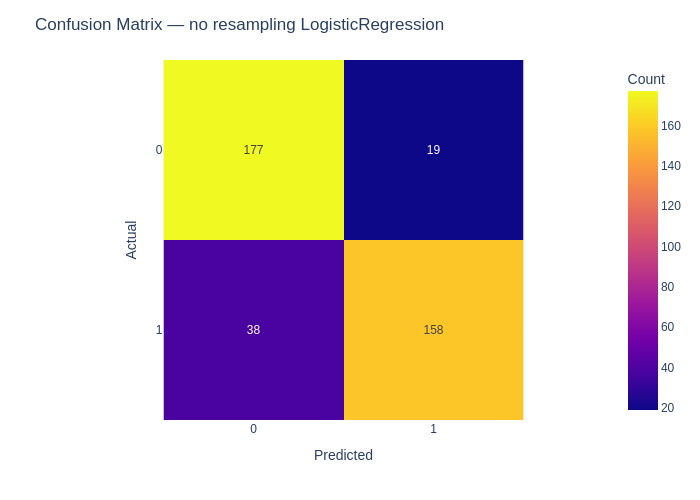


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling RandomForestClassifier model
              precision    recall  f1-score   support

           0       0.81      0.98      0.89       196
           1       0.98      0.78      0.87       196

    accuracy                           0.88       392
   macro avg       0.90      0.88      0.88       392
weighted avg       0.90      0.88      0.88       392


Below is the confusion matrix for the no resampling RandomForestClassifier model


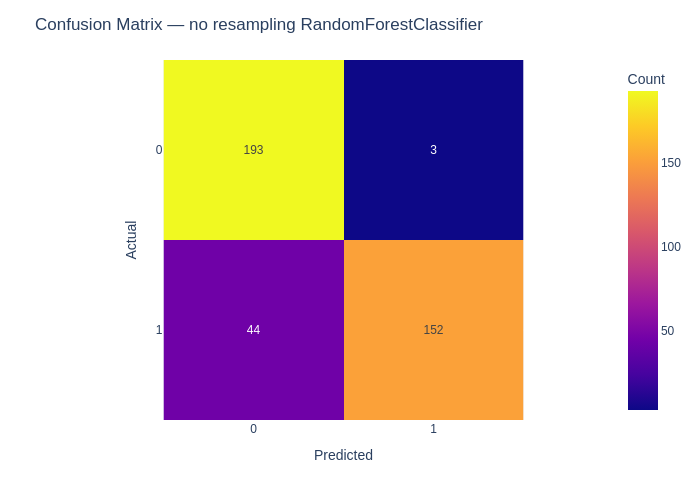


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling SVC model
              precision    recall  f1-score   support

           0       0.80      0.94      0.87       196
           1       0.93      0.77      0.84       196

    accuracy                           0.85       392
   macro avg       0.87      0.85      0.85       392
weighted avg       0.87      0.85      0.85       392


Below is the confusion matrix for the no resampling SVC model


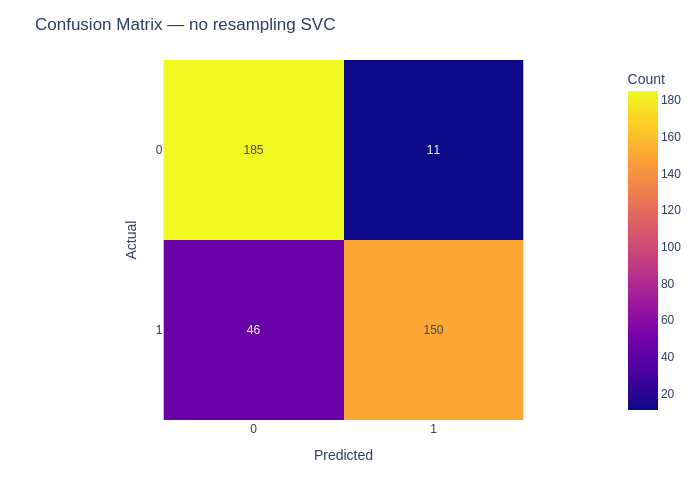


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling XGBClassifier model
              precision    recall  f1-score   support

           0       0.85      0.94      0.89       196
           1       0.93      0.84      0.88       196

    accuracy                           0.89       392
   macro avg       0.89      0.89      0.89       392
weighted avg       0.89      0.89      0.89       392


Below is the confusion matrix for the no resampling XGBClassifier model


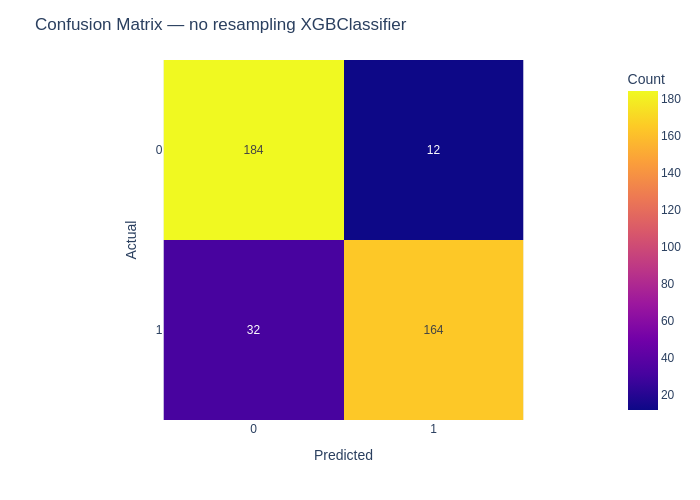


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling LGBMClassifier model
              precision    recall  f1-score   support

           0       0.85      0.95      0.90       196
           1       0.94      0.83      0.88       196

    accuracy                           0.89       392
   macro avg       0.90      0.89      0.89       392
weighted avg       0.90      0.89      0.89       392


Below is the confusion matrix for the no resampling LGBMClassifier model


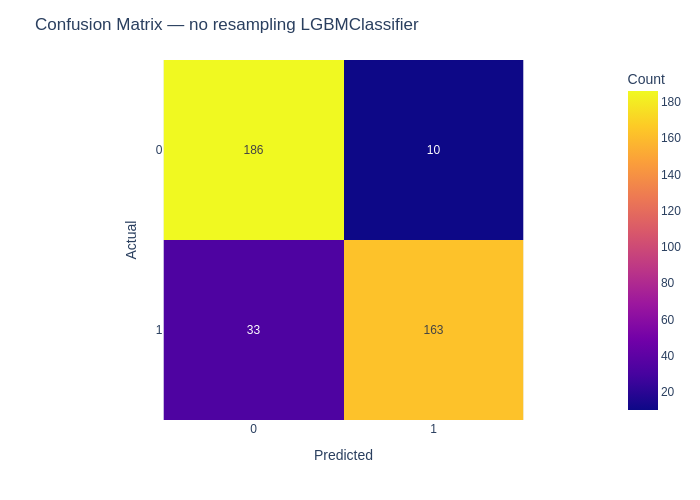


 -----   ----------   ----------   ----------   ----------   ----------   ----- 


Model evaluation summary report: no resampling dataset


,accuracy,precision,recall,f1_score
model_name,,,,
CatBoostClassifier,0.91,0.92,0.91,0.91
LGBMClassifier,0.89,0.90,0.89,0.89
XGBClassifier,0.89,0.89,0.89,0.89
RandomForestClassifier,0.88,0.90,0.88,0.88
AdaBoostClassifier,0.87,0.89,0.87,0.87
LogisticRegression,0.85,0.86,0.85,0.85
SVC,0.85,0.87,0.85,0.85
DecisionTreeClassifier,0.82,0.82,0.82,0.82
KNeighborsClassifier,0.81,0.83,0.81,0.81


In [275]:
# Run the function to train models and return performances, no feature creation
preprocessor = create_preprocessor(
    categorical_cols=categorical_cols,
    feature_creation_pipeline=None,
    include_feature_creation=False
)
models_eval, trained_models = evaluate_models(
    models=models,
    feature_creation_pipeline=feature_creation_pipeline,
    preprocessor=preprocessor,
    X_train=X_train,
    y_train_encoded=y_train_encoded,
    X_eval=X_eval,
    y_eval_encoded=y_eval_encoded,
    target_class=target_class_names,
    apply_resampling=False,
    create_features=False,
    random_state=RANDOM_STATE
)
models_eval

This is the classification report of the no resampling AdaBoostClassifier model
              precision    recall  f1-score   support

           0       0.80      1.00      0.89       196
           1       1.00      0.75      0.86       196

    accuracy                           0.88       392
   macro avg       0.90      0.88      0.87       392
weighted avg       0.90      0.88      0.87       392


Below is the confusion matrix for the no resampling AdaBoostClassifier model


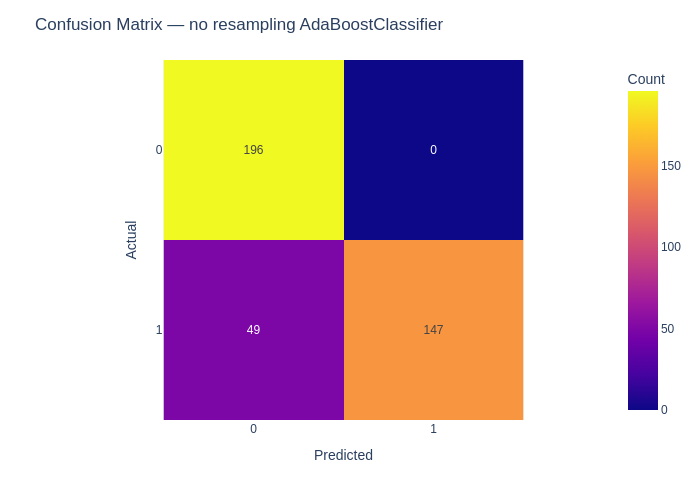


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling CatBoostClassifier model
              precision    recall  f1-score   support

           0       0.85      0.98      0.91       196
           1       0.98      0.82      0.89       196

    accuracy                           0.90       392
   macro avg       0.91      0.90      0.90       392
weighted avg       0.91      0.90      0.90       392


Below is the confusion matrix for the no resampling CatBoostClassifier model


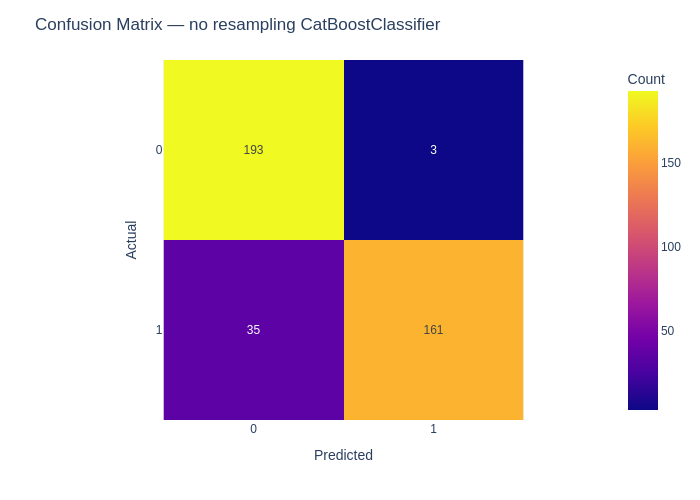


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling DecisionTreeClassifier model
              precision    recall  f1-score   support

           0       0.84      0.78      0.81       196
           1       0.80      0.85      0.82       196

    accuracy                           0.82       392
   macro avg       0.82      0.82      0.82       392
weighted avg       0.82      0.82      0.82       392


Below is the confusion matrix for the no resampling DecisionTreeClassifier model


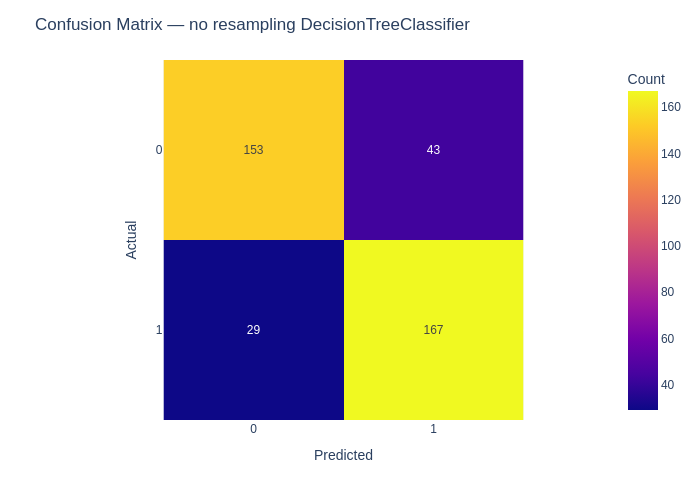


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling KNeighborsClassifier model
              precision    recall  f1-score   support

           0       0.75      0.99      0.86       196
           1       0.99      0.67      0.80       196

    accuracy                           0.83       392
   macro avg       0.87      0.83      0.83       392
weighted avg       0.87      0.83      0.83       392


Below is the confusion matrix for the no resampling KNeighborsClassifier model


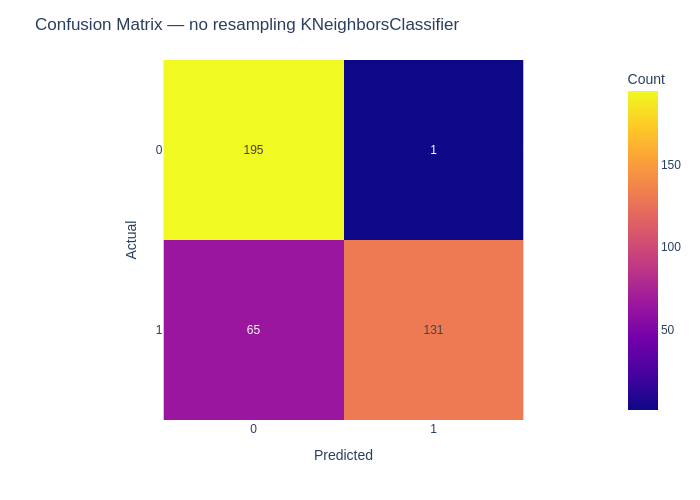


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling LogisticRegression model
              precision    recall  f1-score   support

           0       0.85      1.00      0.92       196
           1       1.00      0.82      0.90       196

    accuracy                           0.91       392
   macro avg       0.92      0.91      0.91       392
weighted avg       0.92      0.91      0.91       392


Below is the confusion matrix for the no resampling LogisticRegression model


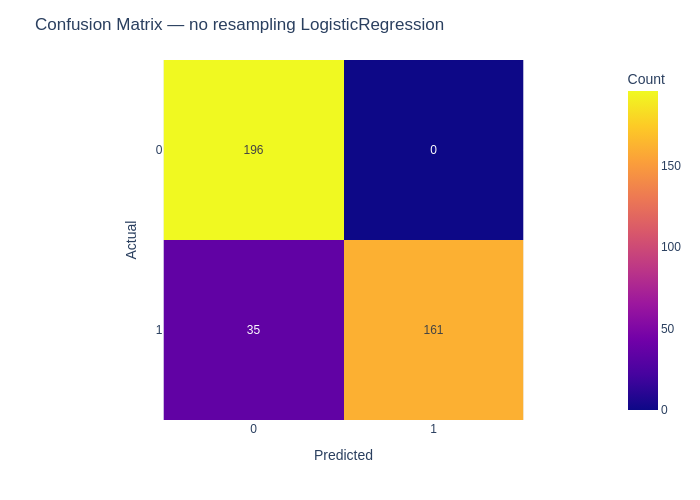


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling RandomForestClassifier model
              precision    recall  f1-score   support

           0       0.85      0.99      0.92       196
           1       0.99      0.82      0.90       196

    accuracy                           0.91       392
   macro avg       0.92      0.91      0.91       392
weighted avg       0.92      0.91      0.91       392


Below is the confusion matrix for the no resampling RandomForestClassifier model


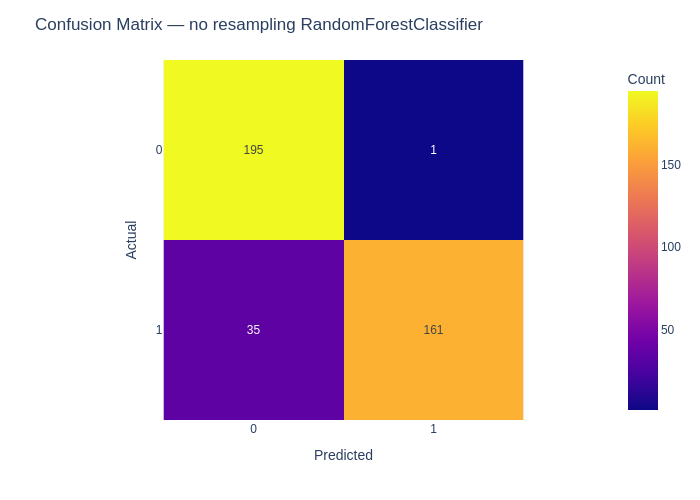


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling SVC model
              precision    recall  f1-score   support

           0       0.85      1.00      0.92       196
           1       1.00      0.82      0.90       196

    accuracy                           0.91       392
   macro avg       0.92      0.91      0.91       392
weighted avg       0.92      0.91      0.91       392


Below is the confusion matrix for the no resampling SVC model


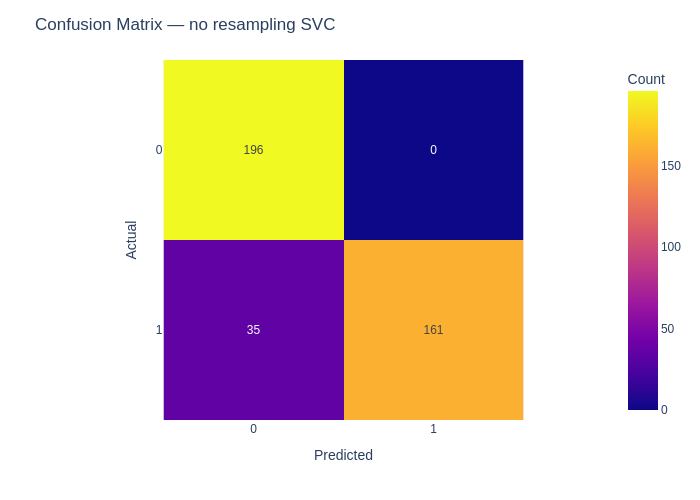


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling XGBClassifier model
              precision    recall  f1-score   support

           0       0.85      0.93      0.89       196
           1       0.93      0.83      0.88       196

    accuracy                           0.88       392
   macro avg       0.89      0.88      0.88       392
weighted avg       0.89      0.88      0.88       392


Below is the confusion matrix for the no resampling XGBClassifier model


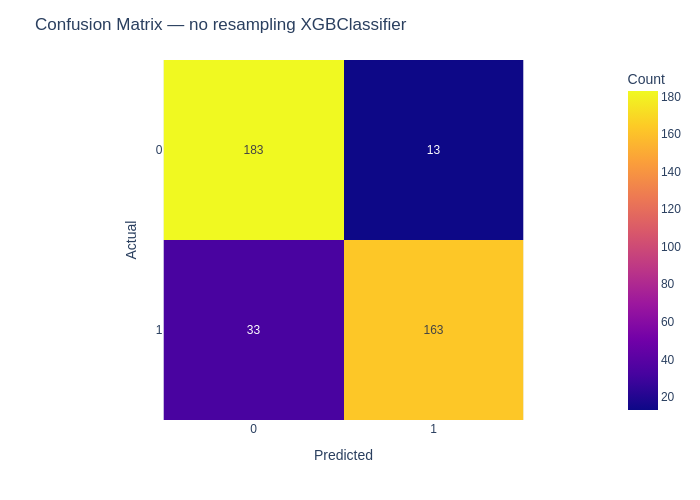


 -----   ----------   ----------   ----------   ----------   ----------   ----- 

This is the classification report of the no resampling LGBMClassifier model
              precision    recall  f1-score   support

           0       0.85      0.95      0.90       196
           1       0.95      0.83      0.89       196

    accuracy                           0.89       392
   macro avg       0.90      0.89      0.89       392
weighted avg       0.90      0.89      0.89       392


Below is the confusion matrix for the no resampling LGBMClassifier model


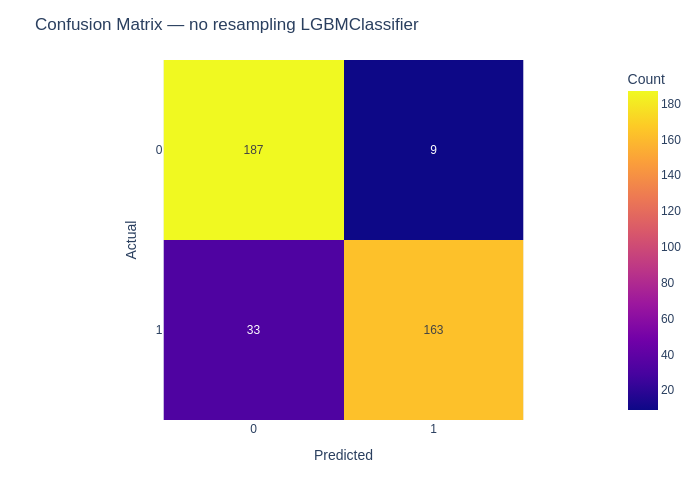


 -----   ----------   ----------   ----------   ----------   ----------   ----- 


Model evaluation summary report: no resampling dataset


,accuracy,precision,recall,f1_score
model_name,,,,
LogisticRegression,0.91,0.92,0.91,0.91
SVC,0.91,0.92,0.91,0.91
RandomForestClassifier,0.91,0.92,0.91,0.91
CatBoostClassifier,0.90,0.91,0.90,0.90
LGBMClassifier,0.89,0.90,0.89,0.89
XGBClassifier,0.88,0.89,0.88,0.88
AdaBoostClassifier,0.88,0.90,0.88,0.87
KNeighborsClassifier,0.83,0.87,0.83,0.83
DecisionTreeClassifier,0.82,0.82,0.82,0.82


In [276]:
# Run the function to train models and return performances, with feature creation
preprocessor = create_preprocessor(
    categorical_cols=categorical_cols,
    feature_creation_pipeline=feature_creation_pipeline,
    include_feature_creation=True
)
models_eval_cf, trained_models_cf = evaluate_models(
    models=models,
    feature_creation_pipeline=feature_creation_pipeline,
    preprocessor=preprocessor,
    X_train=X_train,
    y_train_encoded=y_train_encoded,
    X_eval=X_eval,
    y_eval_encoded=y_eval_encoded,
    target_class=target_class_names,
    apply_resampling=False,
    create_features=True,
    random_state=RANDOM_STATE
)
models_eval_cf

### 4.2 Compare model evaluation report on models with and without feature creation


In [257]:
models_eval

,accuracy,precision,recall,f1_score
model_name,,,,
CatBoostClassifier,0.91,0.92,0.91,0.91
LGBMClassifier,0.89,0.90,0.89,0.89
XGBClassifier,0.89,0.89,0.89,0.89
RandomForestClassifier,0.88,0.90,0.88,0.88
AdaBoostClassifier,0.87,0.89,0.87,0.87
LogisticRegression,0.85,0.86,0.85,0.85
SVC,0.85,0.87,0.85,0.85
DecisionTreeClassifier,0.82,0.82,0.82,0.82
KNeighborsClassifier,0.81,0.83,0.81,0.81


In [259]:
with_without_cf_models = pd.merge(
    models_eval[['f1_score']],
    models_eval_cf[['f1_score']],
    left_index=True,
    right_index=True,
    how='inner',
    suffixes=('_before', '_after')
).sort_values(ascending=False, by=['f1_score_before'])

with_without_cf_models

,f1_score_before,f1_score_after
model_name,,
CatBoostClassifier,0.91,0.90
LGBMClassifier,0.89,0.89
XGBClassifier,0.89,0.88
RandomForestClassifier,0.88,0.91
AdaBoostClassifier,0.87,0.87
LogisticRegression,0.85,0.91
SVC,0.85,0.91
DecisionTreeClassifier,0.82,0.82
KNeighborsClassifier,0.81,0.83


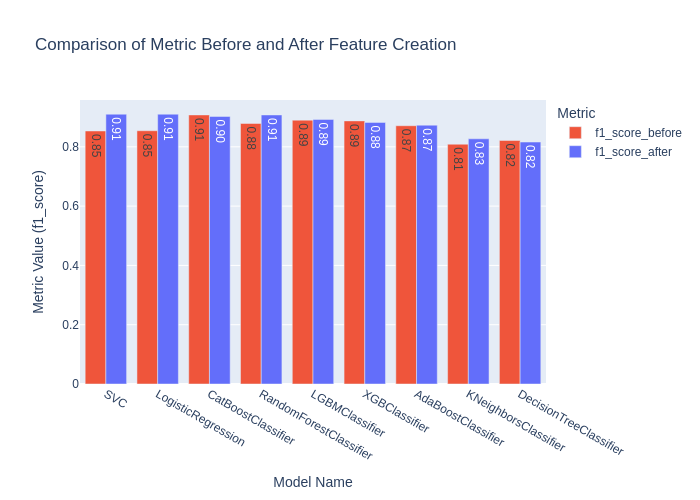

In [266]:
# Melt the dataframe
df_melted_bal = (
    with_without_cf_models
    .reset_index()
    .melt(id_vars='model_name', var_name='metric', value_name='value')
    .sort_values(ascending=False, by=['value'])
)

# Convert the 'model_name' series to a list for category_orders
category_orders = {
    'model_name': df_melted_bal['model_name'].tolist(),  # Convert Series to list
    'metric': ['f1_score_before', 'f1_score_after']
}

# Make the plot
fig = px.bar(
    df_melted_bal,
    x='model_name',
    y='value',
    color='metric',
    barmode='group',
    title='Comparison of Metric Before and After Feature Creation',
    labels={'value': 'Metric Value (f1_score)', 'model_name': 'Model Name', 'metric': 'Metric'},
    category_orders=category_orders,
    color_discrete_map={'f1_score_before': COLOR_DISCRETE_SEQUENCE[0], 'f1_score_after': COLOR_DISCRETE_SEQUENCE[1]}, # Use a dictionary for color mapping
    orientation='v',
    height=600,
    text_auto=True,
)

# format text
fig.update_traces(texttemplate='%{y:.2f}')

# Show plot
show_plot(fig)

**Model Selection Insight – F1 Score Comparison:**

Across the evaluated classifiers, ensemble models and linear classifiers exhibit notable differences before and after preprocessing or feature adjustments:

* **Top performers post-adjustment:** `RandomForestClassifier`, `LogisticRegression`, and `SVC` show significant improvement, achieving an F1 score of **0.91**, indicating strong generalization potential.
* **Stable performers:** `CatBoostClassifier`, `LGBMClassifier`, and `XGBClassifier` maintain high scores (0.88–0.91), but with minimal change, suggesting they are relatively robust to preprocessing.
* **Underperformers:** `DecisionTreeClassifier` and `KNeighborsClassifier` remain lower (0.82–0.83), highlighting limitations in handling feature interactions or data imbalance.

**Implications for model selection and next steps:**

1. **Primary candidates for deployment:** `RandomForestClassifier`, `LogisticRegression`, and `SVC`, as they achieve the highest F1 scores post-adjustment.
2. **Hyperparameter tuning potential:** Even strong performers like Random Forest, Logistic Regression, and SVC may benefit from **targeted hyperparameter optimization** to further improve precision/recall trade-offs and robustness.
3. **Efficiency vs. complexity trade-off:** While gradient boosting models (CatBoost, LGBM, XGB) are stable, they may incur higher training time compared to simpler models like Logistic Regression, which now matches top performance.

---

**Recommendation:** Deploy **Logistic Regression** for simplicity and speed or **Random Forest** for robustness to feature interactions, as both achieve top F1 scores (0.91). **CatBoost** is not chosen due to minimal gain after preprocessing and higher complexity, while **SVC** is avoided because of slower inference, more tuning requirements, and lower interpretability. Hyperparameter tuning will be applied to further optimize performance and results monitored  on new data to ensure stability.


## 4.3 Hyperparameter tuning- GridSearch
### 4.3.1 Define hyperparameters to search

In [283]:
# Define the hyperparameters to search

param_grids = {
    'LogisticRegression': {  # Logistic Regression
        'classifier__C': [0.01, 0.1, 1, 10, 50, 100],  # wider regularization range
        'classifier__solver': ['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga'],
        'classifier__max_iter': [100, 200, 500, 1000],  # allow higher iterations for convergence
        'classifier__penalty': ['l2'],  # typically l2 is default
    },
    'RandomForestClassifier': {  # Random Forest
        'classifier__n_estimators': [50, 100, 200],  # more coverage
        'classifier__max_depth': [None, 10, 20, 30],  # allow deeper trees
        'classifier__min_samples_split': [2, 5, 10],  # control overfitting
        'classifier__min_samples_leaf': [1, 2, 4],     # control overfitting
        'classifier__max_features': ['sqrt', 'log2', None]  # different splitting strategies
    }
}


param_grids = {
    k: v
    for k, v in param_grids.items()
    if any(model.__class__.__name__ == k for model in models)
}

param_grids.keys()

dict_keys(['LogisticRegression', 'RandomForestClassifier'])

### 4.3.2 Cross validating and Tuning models with the hyperparameters

In [ ]:
params = {}
search_histories = {}

# With Features Creation
feature_creation_pipeline = Pipeline([
    ('feature_creator', FeatureCreation(categorical_cols=categorical_cols, degree=2))
])

preprocessor = create_preprocessor(
    categorical_cols=categorical_cols,
    feature_creation_pipeline=feature_creation_pipeline,
    include_feature_creation=True
)

selected_models = [model for model in models if model.__class__.__name__ in param_grids]

for model in selected_models:
    final_pipeline = Pipeline(steps=[
        ('feature_creator', feature_creation_pipeline),
        ('preprocessor', preprocessor),
        # Feature selection should be applied after preprocessing to select from all generated features
        ('feature-selection', SelectKBest(mutual_info_classif, k='all')),
        ('classifier', model)
    ])

    model_name = model.__class__.__name__

    # Ensure the model name is in the param_grids dictionary
    if model_name in param_grids:
        print(f"Tuning hyperparameters for {model_name}...")
        param_grid = param_grids[model_name]

        # Create a StratifiedKFold object
        skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

        searcher = GridSearchCV(
            estimator = final_pipeline,
            param_grid = param_grid,
            cv = skf, # StratifiedKFold for imbalanced dataset
            scoring = 'f1_weighted',
            verbose = 3, # verbose=3 # Show the steps as output
            n_jobs = -1
        )

        # Fit GridSearchCV
        searcher.fit(X_train, y_train_encoded)
        search_history = pd.DataFrame(searcher.cv_results_)
        params[model_name] = searcher
        search_histories[model_name] = search_history
    else:
        print(f"Skipping {model_name} as no parameter grid is defined.")


for model_name, search in params.items():
    print(f'Best hyperparamters for {model_name}:{search.best_params_}')

Tuning hyperparameters for LogisticRegression...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
Tuning hyperparameters for RandomForestClassifier...
Fitting 5 folds for each of 540 candidates, totalling 2700 fits


### 4.3.3 Get the performance of each model with the best hyperparameters

In [ ]:
def get_best_models(params):
    best_models_metrics = pd.DataFrame(columns=['model_name', 'accuracy', 'precision', 'recall', 'f1_score'])

    best_models = {}

    for model_name, search in params.items():
        best_model = search.best_estimator_
        best_models[model_name] = best_model

        # Make predictions with the tuned model
        y_pred = best_model.predict(X_eval)

        # Store classification report values as a dictionary
        metric = classification_report(y_eval_encoded, y_pred, output_dict=True)

        #Grab values from the balanced metric dictionary
        accuracy = metric['accuracy']
        precision = metric['weighted avg']['precision']
        recall  = metric['weighted avg']['recall']
        f1_score =  metric['weighted avg']['f1-score']

        #Add these values to the table
        best_models_metrics.loc[len(best_models_metrics)] = [model_name, precision, recall, accuracy, f1_score]

    best_models_metrics.set_index('model_name', inplace=True)
    return best_models, best_models_metrics

best_models, best_models_metrics = get_best_models(params)

In [ ]:
best_models_metrics.sort_values(by=METRIC, ascending=False, inplace=True) # f1_score
best_models_metrics

### 4.3.4 Comparing models using best hyperparameters from GridSearch CV

In [ ]:
fig = px.bar(
    best_models_metrics.sort_values(by=METRIC, ascending=True), x=METRIC,
    labels={'f1_score': 'Best score (f1_weighted)', 'model_name': 'Model Name'},
    title='Comparing models using best hyperparameters from GridSearch CV',
    orientation='h',
    height=700
)

# Show the plot
show_plot(fig)

- It is evident that `Logistic...` is the best model after hyperparameter tuning followed closely by `Rand`.

### 4.3.5 Compare models before and after hyperparameter tuning using f1 score (weighted) metric


In [ ]:
metric_before_after_tuning_models = pd.merge(
    models_eval[['f1_score']],
    best_models_metrics[['f1_score']],
    left_index=True,
    right_index=True,
    how='inner',
    suffixes=('_before', '_after')
).sort_values(ascending=False, by='f1_score_after')

metric_before_after_tuning_models

In [ ]:
# Melt the dataframe
df_melted_tuning = (
    metric_before_after_tuning_models.reset_index()
    .melt(id_vars='model_name', var_name='metric', value_name='value')
    .sort_values(ascending=False, by=['value'])
)

category_orders = {
    'model_name': df_melted_tuning.model_name,
    'metric':['f1_score_before', 'f1_score_after']
}

# Make the plot
fig = px.bar(
    df_melted_tuning,
    x='model_name',
    y='value',
    color='metric',
    barmode='group',
    title='Comparison of Metric Before and After Hyper parameter tuning',
    labels={'value': f'Metric Value ({metric.__name__})', 'model_name': 'Model Name', 'metric': 'Metric'},
    category_orders=category_orders,
    orientation='v',
    height=600
)

# Show plot
show_plot(fig)

### 4.3.6  Plot the ROC-AUC Curve for all models

In [ ]:
fig = go.Figure()

# Add confusion matrix to all pipelines
all_confusion_matrix = {}

# Add ROC data for all pipelines
all_roc_data = {}

for model_name, pipeline in best_models.items():
    y_score = pipeline.predict_proba(X_eval)[:, 1]

    fpr, tpr, thresholds = roc_curve(y_eval_encoded, y_score)

    roc_auc = auc(fpr, tpr)

    roc_data_df = pd.DataFrame({'False Positive rate': fpr, 'True Positive Rate': tpr, 'Thresholds': thresholds})

    all_roc_data[model_name] = roc_data_df


    # Generate the confusion matrix
    y_pred = pipeline.predict(X_eval)

    conf_matrix = confusion_matrix(y_eval_encoded, y_pred)

    all_confusion_matrix[model_name] = conf_matrix

    fig = fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'{model_name} (AUC ={roc_auc:.2f})'))

    fig = fig.update_layout(
        title=f'ROC AUC Curve',
        xaxis_title='False Positive Rate',
        yaxis_title='True Positive Rate',
        legend=dict(
            x=1.02,
            y=0.98
        ),
        yaxis=dict(scaleanchor="x", scaleratio=1),
        xaxis=dict(constrain='domain'),
        height=800
)

fig = fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)


show_plot(fig)

### 4.3.7.1 Get the best two model pipelines


In [ ]:
def get_model_by_rank(rank: int, best_models_metrics: pd.DataFrame, best_models: Dict[Pipeline, imPipeline], metric):
    mask = best_models_metrics[metric.__name__] == best_models_metrics[metric.__name__].nlargest(rank).iloc[rank-1]
    rank_model_metric = best_models_metrics[mask]
    rank_model_name = rank_model_metric.index[0]
    model = best_models[rank_model_name]
    return model, rank_model_name, rank_model_metric

In [ ]:
best_model, best_model_name, best_model_metric = get_model_by_rank(1, best_models_metrics, best_models, metric)
best_model

In [ ]:
# Display the best model
print(f"The best model is: {best_model_name}")

In [ ]:
second_best_model, second_best_model_name, second_best_model_metric  = get_model_by_rank(2, best_models_metrics, best_models, metric)
second_best_model

In [ ]:
# Display the second best model
print(f"The second best model is: {second_best_model_name}")

### 4.3.7.2  Plot the ROC-AUC Curve for the best two models

In [ ]:
fig = go.Figure()

for pipeline, model_name in [(best_model, best_model_name), (second_best_model, second_best_model_name)]:
    y_score = pipeline.predict_proba(X_eval)[:, 1]

    fpr, tpr, thresholds = roc_curve(y_eval_encoded, y_score)

    roc_auc = auc(fpr, tpr)

    fig = fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'{model_name} (AUC ={roc_auc:.2f})'))


best_model_f1 = round(best_model_metric[metric.__name__].iloc[0], 3)
second_best_model_f1 = round(second_best_model_metric[metric.__name__].iloc[0], 3)
fig = fig.update_layout(
    title=f"ROC AUC Curve for {best_model_name} and {second_best_model_name} (F1-Weighted Scores: {best_model_f1} and {second_best_model_f1} respectively)",
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    legend=dict(
        x=1.02,
        y=0.98
    ),
    yaxis=dict(scaleanchor="x", scaleratio=1),
    xaxis=dict(constrain='domain'),
    height=800
)

best_two_roc_fig = fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

show_plot(best_two_roc_fig)

### 4.3.7.3 Feature importances of the best two models

In [ ]:
def display_feature_importances(pipeline: Union[Pipeline, imPipeline], new_features: List[str], f1: str):
    # Get the numerical feature names after transformation
    numerical_features_transformed = pipeline.named_steps['preprocessor'].named_transformers_['numerical_pipeline'].named_steps['scaler'].get_feature_names_out(numerical_features)

    # Get the categorical feature names after transformation
    categorical_features_transformed = pipeline.named_steps['preprocessor'].named_transformers_['categorical_pipeline'].named_steps['encoder'].get_feature_names_out(categorical_features)

    # Get the created feature names after transformation
    created_features_transformed = pipeline.named_steps['preprocessor'].named_transformers_['feature_creation_pipeline'].named_steps['encoder'].get_feature_names_out(new_features)

    # Get the feature names after transformation
    feature_columns = np.concatenate((numerical_features_transformed, categorical_features_transformed, created_features_transformed))

    importances_scores = pipeline.named_steps['classifier'].feature_importances_

    importances_df = pd.DataFrame({'feature': feature_columns, 'score': importances_scores})

    # Magnitude of impact
    importances_df.sort_values(by="score", ascending=True, inplace=True)

    # Create a horizontal bar chart using Plotly Express
    fig = px.bar(
        importances_df,
        x='score',
        y='feature',
        orientation='h',  # Set orientation to horizontal
        title=f"Feature Importances- {pipeline['classifier'].__class__.__name__} (F1-Weighted Scores: {f1})",
        labels={'Score': 'Score', 'Feature': 'feature'},
        height=700,
        color='score'
    )

    # Show the plot
    show_plot(fig)

    return fig

In [ ]:
best_model_imp_fig = display_feature_importances(best_model, new_features, f1=best_model_f1)

In [ ]:
second_best_model_imp_fig = display_feature_importances(second_best_model, new_features, f1=second_best_model_f1)

### 4.5 Persist the models 💾

In [ ]:
def path_maker(filename: str, path: str) -> str:
    '''
    Creates a file path by combining the given directory and filename.
    If the directory does not exist, it is created.

    Parameters:
    filename (str): The name of the file.
    path (str): The path to the directory where the file should be located.

    Returns:
    str: The full path to the file.
    '''
    if not os.path.exists(path):
        os.makedirs(path)

    file_path = os.path.join(path, filename)

    return file_path

#### 4.5.1 Using Joblib

In [ ]:
# Models
compdir = SAVE_MODELS
for model_name, pipeline in best_models.items():
    filename = f'{model_name}.joblib'
    filepath = path_maker(filename, compdir)
    joblib.dump(pipeline, filepath)

# Encoder
compdir = SAVE_MODELS+'enc'
filename = 'encoder.joblib'
filepath = path_maker(filename, compdir)
joblib.dump(encoder, filepath)

# External pipeline functions
compdir = SAVE_MODELS+'pipeline_func'
pipeline_functions = {'as_category': as_category, 'feature_creation': feature_creation}
filename = 'pipeline_functions.joblib'
filepath = path_maker(filename, compdir)
joblib.dump(pipeline_functions, filepath)

print('💾 All models, encoder, and pipeline functions have been saved.')

#### 4.5.2 Using HuggingFace

#### 4.5.2.1 Login to HuggingFace and save token

In [ ]:
notebook_login(write_permission=True)

#### 4.5.2.2 Read the token file

In [ ]:
with open(TOKEN_FILE, 'r') as file:
    token = file.read()

#### 4.5.2.3 Push the best two models to HuggingFace

In [ ]:
def push_to_huggingface(model_name: str, model, imp_fig, best_two_roc_fig, data: pd.DataFrame, token: str):
    """
    Push a trained model, plots, and metadata to Hugging Face Hub with a structured Model Card.

    Args:
        model_name (str): Name of the model.
        model: Trained scikit-learn model object.
        imp_fig: Feature importance plot figure.
        best_two_roc_fig: ROC curve plot figure.
        data (pd.DataFrame): Dataset used for training or sample data.
        token (str): Hugging Face Hub access token.

    Returns:
        str: Repository ID on Hugging Face Hub.
    """

    # Define local paths
    huggingface_fd = Path(SAVE_MODELS) / "huggingface" / model_name
    huggingface_fd.mkdir(parents=True, exist_ok=True)
    model_fp = huggingface_fd / f"{model_name}.joblib"

    # Save model locally
    joblib.dump(model, model_fp)

    # Create repository on Hugging Face Hub
    repo_id = f"gabcares/{model_name}-Sepsis"
    create_repo(repo_id, exist_ok=True, private=False, token=token)

    # Generate plots and save locally
    imp_fig_fp = show_plot(imp_fig, save_only=True, save_dir=huggingface_fd, interactive=False)
    roc_fp = show_plot(best_two_roc_fig, save_only=True, save_dir=huggingface_fd, interactive=False)

    # Create Model Card
    model_card = ModelCard(
        language="en",
        license="mit",
        tags=["tabular-classification", "scikit-learn", "sepsis"],
        dataset_tags=["sepsis"],
        metrics=["f1_weighted"],
        model_name=model_name
    )

    model_card.add(
        model_description=f"This {model_name} model predicts sepsis risk using clinical and lifestyle data. Trained on the [Kaggle Sepsis dataset](https://www.kaggle.com/datasets/chaunguynnghunh/sepsis/data).",
        limitations="Further feature engineering is recommended to improve the weighted F1 score. Collaborate on [GitHub](https://github.com/D0nG4667/sepsis_prediction_full_stack).",
        get_started_code=f"import joblib\nclf = joblib.load('{model_fp.name}')",
        model_card_authors="Gabriel Okundaye",
        citation_bibtex="@inproceedings{...,year={2024}}"
    )

    # Save model card locally
    model_card_path = huggingface_fd / "README.md"
    model_card.save(model_card_path)

    # Upload entire folder including model, plots, and README
    upload_folder(
        folder_path=huggingface_fd,
        repo_id=repo_id,
        path_in_repo="",
        token=token,
        commit_message=f"Add {model_name} model, plots, and Model Card"
    )

    return repo_id


In [ ]:
best_model_repo_id = push_to_huggingface(model_name=best_model_name, imp_fig=best_model_imp_fig, data=X_train)

In [ ]:
second_best_model_repo_id =  push_to_huggingface(model_name=second_best_model_name, imp_fig=second_best_model_imp_fig, data=X_train)

#### 4.5.2.4 How to download model from HuggingFace

In [ ]:
# How to download model from HuggingFace
# Define local path
download_repo = Path(SAVE_MODELS) / "huggingface" / "downloaded_model" / best_model_name
download_repo.mkdir(parents=True, exist_ok=True)

# Download the repository from Hugging Face Hub
snapshot_download(
    repo_id=best_model_repo_id,
    cache_dir=download_repo,  # local directory to store files
    repo_type="model",        # optional, default is "model"
    revision="main"           # optional, can specify branch/tag/commit
)



Made with 💖 [Gabriel Okundaye](https://www.linkedin.com/in/dr-gabriel-okundaye)
<span style="color: #aaaaaa;">& Light ✨</span>